In [76]:
%%time

# importing necessary dependencies
import json
from datetime import datetime, timedelta
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd
import seaborn
import plotly.express as px
import csv
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter
from tqdm.notebook import tqdm
import warnings
from IPython.display import clear_output
import investpy
from tabulate import tabulate
import plotly.graph_objects as go
from plotly.subplots import make_subplots

CPU times: total: 0 ns
Wall time: 13.4 ms


# Calculate RRI Scores and Fundamentals

In [2]:
# ISIN to RR ID
rr_isin = pd.read_csv('esg_data/REPRISK_ISINs.csv', quoting=csv.QUOTE_NONE)
rr_isin.columns = ['rr', 'ISIN']
rr_isin['ISIN'] = rr_isin['ISIN'].str.replace('\"', '')
map_isin = rr_isin.set_index('ISIN')['rr'].to_dict()

# Incident Data
incident_data = pd.read_csv('esg_data/REPRISK_EVENTS.csv', quoting=csv.QUOTE_NONE)
incident_data.columns = ['date', 'ID_incident', 'ID_RR', 'reach', 'severity', 'unsharp', 'novelty', 
                         'environment', 'social', 'government', 'crosscutting']

incident_data['date'] = pd.to_datetime(incident_data['date'])
incident_data['severity'].replace({0: 1}, inplace=True)
incident_data['reach'].replace({0: 1}, inplace=True)
incident_data['novelty'].replace({0: 1}, inplace=True)

severity_weights = {1: 1, 
                    2: 10, 
                    3: 100}
reach_weights = {1: 1, 
                 2: 2, 
                 3: 3}
novelty_weights = {1: 1,
                   2: 2}

incident_data["Incident Score"] = (incident_data['severity'].replace(severity_weights)
                                   *incident_data['reach'].replace(reach_weights)
                                   *incident_data['novelty'].replace(novelty_weights))

n_years = 2
n_days = 365*n_years
curvature_ = 1
weights = np.arange(1,n_days + 1)
weights = weights/weights.max()
weights = ((2**weights) - 1)**curvature_
time_weights = pd.Series(weights)

start = pd.Timestamp("2007-01-01")
todate = max(incident_data['date']).strftime('%Y-%m-%d')
end = pd.Timestamp(todate)
date_range_extended = pd.date_range(start=start-pd.Timedelta(days=n_days), end=end)
date_range = pd.date_range(start=start, end=end)
incident_data.set_index("ID_RR", inplace=True)

def get_raw_scores(id_, incident_data, col="Incident Score"):
    try:
        company_incidents = incident_data.reset_index().set_index('date')
        company_incidents = company_incidents[company_incidents['ID_RR']==id_]
        incident_scores = company_incidents[col].groupby(level=0).sum().reindex(date_range_extended).fillna(0)
        stacked_incident_score = incident_scores.rolling(n_days).apply(lambda scores: np.dot(scores, weights)).fillna(0)
        stacked_incident_score = stacked_incident_score.reindex(date_range)
    except KeyError:
        stacked_incident_score = pd.Series(0, index=date_range)
    stacked_incident_score.name = "Incident Score"
    return stacked_incident_score  

def scale(series, lambda_=0.000105, curvature=5.3):
    return 100*((1 - np.exp(-lambda_*series))**(1/curvature))

scaling = scale(pd.Series(range(750)))

def max_decay(series, decay=0.5**(1/365)):
    new_series = pd.Series(index=series.index, dtype="float")
    previous = 0
    for date, value in series.items():
        if previous > 0:
            if value/previous < decay:
                new_series[date] = previous*decay
            else:
                new_series[date] = value
        else:
            new_series[date] = value
            
        previous = new_series[date]
    return new_series

C:\Users\anish\AppData\Local\Temp\ipykernel_74556\2265256274.py:13: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  incident_data['severity'].replace({0: 1}, inplace=True)
C:\Users\anish\AppData\Local\Temp\ipykernel_74556\2265256274.py:14: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

In [58]:
incident_data[incident_data.index == map_isin['US26441C2044']]

,date,ID_incident,reach,severity,unsharp,novelty,environment,social,government,crosscutting,Incident Score
ID_RR,,,,,,,,,,,
1143,2007-03-22,888,2,1,0,1,1,0,0,0,2
1143,2007-07-26,1453,2,1,1,2,1,1,0,0,4
1143,2007-10-23,2067,1,2,0,2,1,1,0,0,20
1143,2007-10-11,2082,1,1,0,1,1,1,0,0,1
1143,2007-12-03,2381,1,2,1,2,0,1,0,1,20
...,...,...,...,...,...,...,...,...,...,...,...
1143,2024-02-21,8469760,3,1,0,1,0,1,0,1,3
1143,2024-03-13,8480478,1,2,0,1,1,0,1,0,10
1143,2024-04-11,8486080,3,1,0,1,0,1,0,1,3


In [3]:
# read spx historical constituents
const = pd.read_csv("esg_data/spx_constituents.csv", quoting=csv.QUOTE_NONE, delimiter=' ')
const.columns = ['date'] + [x.replace('\"', '') for x in const.columns[1:]]
const['date'] = const['date'].str.replace('\"', '')
const.set_index('date', inplace=True)

# map each date to its spx constituents
spx_const = {}

for i in tqdm(range(len(const))):
    row = const.iloc[i]
    date = const.index[i]
    spx_const[date] = set()
    for isin in const.columns:
        if row[isin] == 1:
            spx_const[date].add(isin)

# all the spx isin constituents ever
all_spx_isin = set(const.columns)

# read historical euro constituents list
const = pd.read_csv("esg_data/stoxx_constituents.csv", quoting=csv.QUOTE_NONE, delimiter=' ')
const.columns = ['date'] + [x.replace('\"', '') for x in const.columns[1:]]
const['date'] = const['date'].str.replace('\"', '')
const.set_index('date', inplace=True)

# map each date to its eurostoxx constituents
euro_const = {}

for i in tqdm(range(len(const))):
    row = const.iloc[i]
    date = const.index[i]
    euro_const[date] = set()
    for isin in const.columns:
        if row[isin] == 1:
            euro_const[date].add(isin)

all_euro_isin = set(const.columns)

  0%|          | 0/6323 [00:00<?, ?it/s]

  0%|          | 0/6364 [00:00<?, ?it/s]

In [4]:
spx_esg = {}

# calculate and plot ESG sub-scores and overall score for each isin in SPX
esgx = ["environment", "social", "government", "crosscutting"]
for isin in tqdm(all_spx_isin.intersection(set(map_isin.keys()))):
    if len(spx_esg.get(isin, [])):
        continue
    id_ = map_isin[isin]
    scores = {}
    
    series = get_raw_scores(id_, incident_data)
    series = max_decay(scale(series))
    scores['esg_score'] = series
    
    for subscore in esgx:
        series = get_raw_scores(id_, incident_data[incident_data[subscore] == 1])
        series = max_decay(scale(series))
        scores[subscore] = series
    
    spx_esg[isin] = pd.DataFrame(scores)

  0%|          | 0/1050 [00:00<?, ?it/s]

In [5]:
for isin in tqdm(all_spx_isin.intersection(set(map_isin.keys()))):
    spx_esg[isin] = spx_esg[isin].to_dict(orient='index')

  0%|          | 0/1050 [00:00<?, ?it/s]

In [6]:
euro_esg = {}

# calculate and plot ESG sub-scores and overall score for each isin in Eurostoxx 600
esgx = ["environment", "social", "government", "crosscutting"]
for isin in tqdm(all_euro_isin.intersection(set(map_isin.keys()))):
    if len(euro_esg.get(isin, [])):
        continue
    id_ = map_isin[isin]
    scores = {}
    
    series = get_raw_scores(id_, incident_data)
    series = max_decay(scale(series))
    scores['esg_score'] = series
    
    for subscore in esgx:
        series = get_raw_scores(id_, incident_data[incident_data[subscore] == 1])
        series = max_decay(scale(series))
        scores[subscore] = series
    
    euro_esg[isin] = pd.DataFrame(scores)

  0%|          | 0/1223 [00:00<?, ?it/s]

In [7]:
for isin in tqdm(all_euro_isin.intersection(set(map_isin.keys()))):
    euro_esg[isin] = euro_esg[isin].to_dict(orient='index')

  0%|          | 0/1223 [00:00<?, ?it/s]

In [8]:
# sector data for SPX
sector_data = pd.read_csv("SPsectors.csv", quoting=csv.QUOTE_NONE)
spx_sector = {sector_data['ISIN'].iloc[i]: sector_data['SP_sectors'].iloc[i] for i in range(len(sector_data))}

# sector data for Eurostoxx
euro_sector_data = pd.read_csv("esg_data/stoxx_TR.TRBCEconomicSector.csv", quoting=csv.QUOTE_NONE)
euro_sector_data.columns = ['num', 'isin', 'sector']
for key in ['num', 'isin', 'sector']:
    euro_sector_data[key] = euro_sector_data[key].str.replace('\"', '')
euro_sector = {}
for i in range(len(euro_sector_data)):
    euro_sector[euro_sector_data['isin'].iloc[i]] = euro_sector_data['sector'].iloc[i]

In [9]:
# SPX marketcaps
spx_mc = pd.read_csv("esg_data/spx_TR.CompanyMarketCap.csv", quoting=csv.QUOTE_NONE)

spx_mc.columns = ['num', 'isin', 'market_cap', 'date']

for key in ['num', 'isin', 'market_cap', 'date']:
    spx_mc[key] = spx_mc[key].str.replace('\"', '')

spx_mc = spx_mc.replace(r'^\s*$', np.nan, regex=True)

spx_mc = spx_mc.dropna()

spx_mc['market_cap'] = pd.to_numeric(spx_mc['market_cap'])

spx_mc['date'] = spx_mc['date'].apply(lambda x: datetime.strptime(x, '%Y-%m-%dT%H:%M:%SZ'))
spx_mc.set_index('isin', inplace=True)
spx_mc = spx_mc.drop('num', axis=1)

# Convert to a 2D dictionary (isin -> date -> row)
spx_mc['isin2'] = spx_mc.index
spx_mc = spx_mc.groupby('isin2').apply(
    lambda x: x.set_index('date').drop(columns='isin2').to_dict('index')
).to_dict()

C:\Users\anish\AppData\Local\Temp\ipykernel_74556\4268443288.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  spx_mc = spx_mc.groupby('isin2').apply(


In [10]:
# Euro Marketcaps
euro_mc = pd.read_csv("esg_data/stoxx_TR.CompanyMarketCap.csv", quoting=csv.QUOTE_NONE)

euro_mc.columns = ['num', 'isin', 'market_cap', 'date']

for key in ['num', 'isin', 'market_cap', 'date']:
    euro_mc[key] = euro_mc[key].str.replace('\"', '')

euro_mc = euro_mc.replace(r'^\s*$', np.nan, regex=True)

euro_mc = euro_mc.dropna()

euro_mc['market_cap'] = pd.to_numeric(euro_mc['market_cap'])

euro_mc['date'] = euro_mc['date'].apply(lambda x: datetime.strptime(x, '%Y-%m-%dT%H:%M:%SZ'))
euro_mc.set_index('isin', inplace=True)
euro_mc = euro_mc.drop('num', axis=1)

# Convert to a 2D dictionary (isin -> date -> row)
euro_mc['isin2'] = euro_mc.index
euro_mc = euro_mc.groupby('isin2').apply(
    lambda x: x.set_index('date').drop(columns='isin2').to_dict('index')
).to_dict()

C:\Users\anish\AppData\Local\Temp\ipykernel_74556\1824331477.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  euro_mc = euro_mc.groupby('isin2').apply(


In [11]:
# read SPX stock prices using fundamental data
spx_price = pd.read_csv("esg_data/spx_TR.CLOSEPRICE.csv", quoting=csv.QUOTE_NONE)

spx_price.columns = ['num', 'isin', 'close', 'date']

for key in ['num', 'isin', 'close', 'date']:
    spx_price[key] = spx_price[key].str.replace('\"', '')
    
spx_price = spx_price.replace(r'^\s*$', np.nan, regex=True)
spx_price = spx_price.dropna()
spx_price['close'] =  pd.to_numeric(spx_price['close'])
spx_price['date'] = spx_price['date'].apply(lambda x: datetime.strptime(x, '%Y-%m-%dT%H:%M:%SZ'))
spx_price.set_index('isin', inplace=True)
spx_price = spx_price.drop('num', axis=1)

spx_price = {isin: group for isin, group in tqdm(spx_price.groupby(spx_price.index))}

# read eurosotxx stock prices using fundamental data
euro_price = pd.read_csv("esg_data/stoxx_TR.CLOSEPRICE.csv", quoting=csv.QUOTE_NONE)

euro_price.columns = ['num', 'isin', 'close', 'date']

for key in ['num', 'isin', 'close', 'date']:
    euro_price[key] = euro_price[key].str.replace('\"', '')
    
euro_price = euro_price.replace(r'^\s*$', np.nan, regex=True)
euro_price = euro_price.dropna()
euro_price['close'] =  pd.to_numeric(euro_price['close'])
euro_price['date'] = euro_price['date'].apply(lambda x: datetime.strptime(x, '%Y-%m-%dT%H:%M:%SZ'))
euro_price.set_index('isin', inplace=True)
euro_price = euro_price.drop('num', axis=1)

euro_price = {isin: group for isin, group in tqdm(euro_price.groupby(euro_price.index))}

  0%|          | 0/1064 [00:00<?, ?it/s]

  0%|          | 0/1583 [00:00<?, ?it/s]

  0%|          | 0/505 [00:00<?, ?it/s]



ESG scores for equities distribution on 2022-03-16:


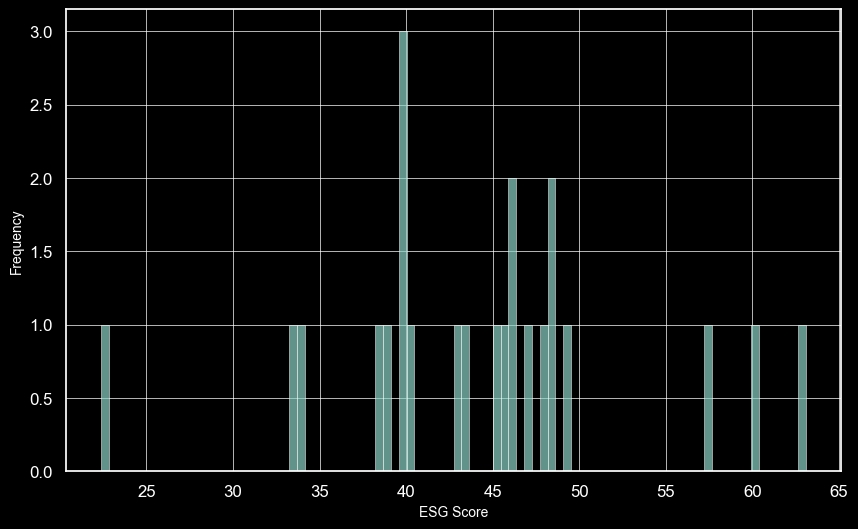

Total count: 23
Zero count: 0
Standard deviation: 8.62
Max score: 63.09
Median: 45.15
Mean (Excluding 0): 44.26
Q1: 39.78
Q3: 48.1
IQR: 8.32

Companies with Top 5 ESG Scores:
American Water Works US0304201033
Eversource Energy US30040W1080
NiSource Inc US65473P1057
Alliant Energy Corp US0188021085
PPL Corporation US69351T1060

Companies with Bottom 5 ESG Scores:
Evergy Inc US30034W1062
Edison International US2810201077
Duke Energy Corporation US26441C2044
FirstEnergy Corporation US3379321074
Sempra Energy US8168511090


In [56]:
# check if there are any isins for which there is no data for a given date
date = '2022-03-16'
date2 = date.replace('-', '/')
scores = []
dates = []
companies = []
na = set()
for isin in tqdm(spx_const[date]):
    try:
        if spx_sector.get(isin) != 'utilities':
            continue
        scores.append([spx_esg[isin][pd.to_datetime(date2)]['esg_score'], isin])
        companies.append(isin)
    except Exception:
        na.add(isin)
scores.sort()


plt.style.use('dark_background') # plot distribution of ESG scores for given date

print(f"\n\nESG scores for equities distribution on {date}:")
values = []
for x in scores:
    if x[0] != 0:
        values.append(x[0])
n, bins, patches = plt.hist(values, bins=90, linewidth=0.5, alpha=0.7)
plt.xlabel('ESG Score', fontsize=10)
plt.ylabel('Frequency', fontsize=10)
plt.show()

# descriptive statistics for distribution
arr = np.array([x[0] for x in scores])
print(f"Total count: {len(scores)}")
print(f"Zero count: {len(arr[arr == 0])}")
print(f"Standard deviation: {round(np.std(arr), 2)}")
print(f"Max score: {round(max(arr), 2)}")
print(f"Median: {round(np.median(arr), 2)}")
print(f"Mean (Excluding 0): {round(arr[arr != 0].mean(), 2)}")
print(f"Q1: {round(np.percentile(arr, 25), 2)}")
print(f"Q3: {round(np.percentile(arr, 75), 2)}")
print(f"IQR: {round(np.subtract(*np.percentile(arr, [75, 25])), 2)}")

print(f"\nCompanies with Top 5 ESG Scores:")
# 5 companies with best ESG score
for rri, isin in scores[:5]:
    try:
        print(investpy.stocks.search_stocks(by='isin', value=isin).full_name[0], isin)
    except Exception:
        print(isin)
print(f"\nCompanies with Bottom 5 ESG Scores:")
for rri, isin in scores[-5:]:
    try:
        print(investpy.stocks.search_stocks(by='isin', value=isin).full_name[0], isin)
    except Exception:
        print(isin)

  0%|          | 0/600 [00:00<?, ?it/s]



ESG scores for equities distribution on 2022-03-16:


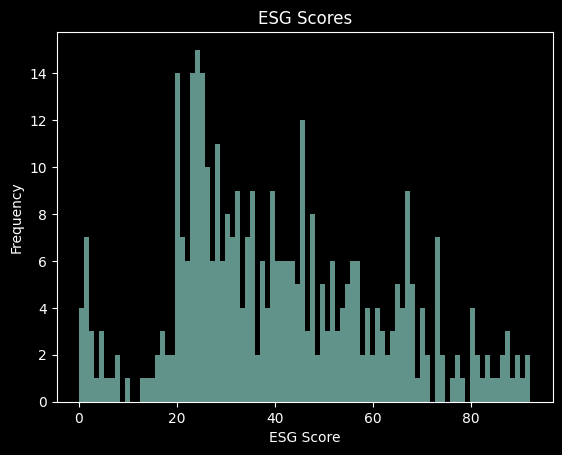

Total count: 547
Zero count: 167
Standard deviation: 25.73
Max score: 92.07
Median: 25.74
Mean (Excluding 0): 40.89
Q1: 0.0
Q3: 45.91
IQR: 45.91

Companies with Top 5 ESG Scores:
Sofina
UCB
Ackermans & Van Haaren NV
Aedifica
BE0974349814

Companies with Bottom 5 ESG Scores:
GB00BP6MXD84
BNP Paribas SA
Nestle SA
Deutsche Bank AG
Total SA


In [24]:
# check if there are any isins for which there is no data for a given date
date = '2022-03-16'
date2 = date.replace('-', '/')
scores = []
dates = []
companies = []
na = set()
for isin in tqdm(euro_const[date]):
    try:
        scores.append([euro_esg[isin][pd.to_datetime(date2)]['esg_score'], isin])
        dates.append(date2)
        companies.append(isin)
    except Exception as e:
        na.add(isin)
scores.sort()


plt.style.use('dark_background') # plot distribution of ESG scores for given date

print(f"\n\nESG scores for equities distribution on {date}:")
values = []
for x in scores:
    if x[0] != 0:
        values.append(x[0])
n, bins, patches = plt.hist(values, bins=90, linewidth=0.5, alpha=0.7)
plt.title('ESG Scores', fontsize=12)
plt.xlabel('ESG Score', fontsize=10)
plt.ylabel('Frequency', fontsize=10)
plt.show()

# descriptive statistics for distribution
arr = np.array([x[0] for x in scores])
print(f"Total count: {len(scores)}")
print(f"Zero count: {len(arr[arr == 0])}")
print(f"Standard deviation: {round(np.std(arr), 2)}")
print(f"Max score: {round(max(arr), 2)}")
print(f"Median: {round(np.median(arr), 2)}")
print(f"Mean (Excluding 0): {round(arr[arr != 0].mean(), 2)}")
print(f"Q1: {round(np.percentile(arr, 25), 2)}")
print(f"Q3: {round(np.percentile(arr, 75), 2)}")
print(f"IQR: {round(np.subtract(*np.percentile(arr, [75, 25])), 2)}")

print(f"\nCompanies with Top 5 ESG Scores:")
# 5 companies with best ESG score
for rri, isin in scores[:5]:
    try:
        print(investpy.stocks.search_stocks(by='isin', value=isin).full_name[0])
    except Exception:
        print(isin)
print(f"\nCompanies with Bottom 5 ESG Scores:")
for rri, isin in scores[-5:]:
    try:
        print(investpy.stocks.search_stocks(by='isin', value=isin).full_name[0])
    except Exception:
        print(isin)

In [88]:
# FILE = "bond_data/historical.constituents_iBoxx_USD_HIGH_YIELD_COMPONENTS.csv"
FILE = "bond_data/historical.constituents_iBoxx_USD_INVESTMENT_GRADE_COMPONENTS.csv" # bond dtta US investment grade location
# FILE = "bond_data/historical.constituents_iBoxx_EUR_HIGH_YIELD_COMPONENTS.csv"

df = pd.read_csv(FILE, quoting=csv.QUOTE_NONE) # convert to pandas dataframe

df.columns = ['date', 'isin', 'index_weight', 'bid_price', 'ask_price']

for key in ['date', 'isin', 'index_weight', 'bid_price', 'ask_price']:
    df[key] = df[key].str.replace('\"', '')
    if key not in {'date', 'isin'}:
        df[key] = df[key].astype(float)

df = df.dropna()

df['date'] = pd.to_datetime(df['date']) # set date as datetime object and make it the index
df.set_index('date', inplace=True)
us_bonds_const = {} # dictionary for bond constituents for each date
for date in tqdm(set(df.index)):
    us_bonds_const[date] = df[df.index == date]

dates = sorted(list(set(df.index))) # sort given dates (monthly)

us_bond_esg = {}
all_us_bond_isin = set(df['isin'])

s = set()
for isin in all_us_bond_isin.intersection(set(map_isin.keys())):
    s.add(map_isin[isin])

  0%|          | 0/215 [00:00<?, ?it/s]

In [ ]:
# calculate and plot ESG sub-scores and overall score for each isin in Eurostoxx 600
esgx = ["environment", "social", "government", "crosscutting"]
for id_ in tqdm(s):
    if len(us_bond_esg.get(id_, [])):
        continue
    scores = {}
    
    series = get_raw_scores(id_, incident_data)
    series = max_decay(scale(series))
    scores['esg_score'] = series
    
    for subscore in esgx:
        series = get_raw_scores(id_, incident_data[incident_data[subscore] == 1])
        series = max_decay(scale(series))
        scores[subscore] = series
    
    us_bond_esg[id_] = pd.DataFrame(scores)

  0%|          | 0/2608 [00:00<?, ?it/s]

# Portfolio Analysis

In [81]:
returns = {}

## S&P Analysis

### Sectoral and Overall Performance

  0%|          | 0/780 [00:00<?, ?it/s]

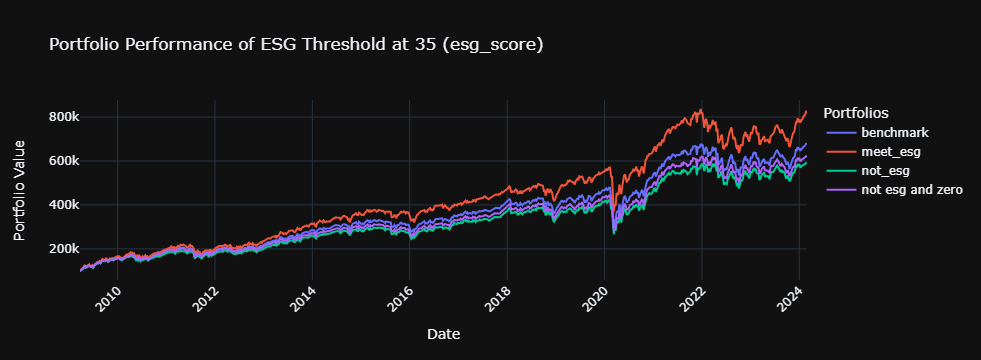


ESG Portfolio Metrics
Average Return (Per Annum): 1.151
Final Value: 824857.34


Non-ESG Portfolio Metrics
Average Return (Per Annum): 1.126
Final Value: 592230.489


Non-ESG/0-RRI Portfolio Metrics
Average Return (Per Annum): 1.13
Final Value: 621664.332


Benchmark Portfolio Metrics
Average Return (Per Annum): 1.136
Final Value: 678757.954



  0%|          | 0/780 [00:00<?, ?it/s]

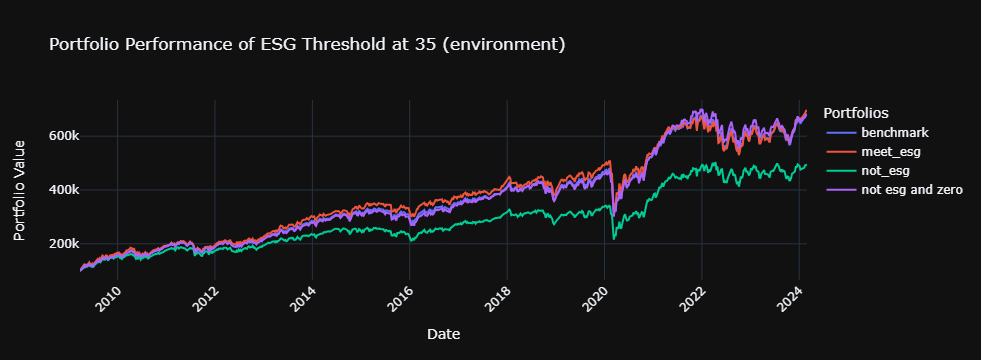


ESG Portfolio Metrics
Average Return (Per Annum): 1.138
Final Value: 694903.876


Non-ESG Portfolio Metrics
Average Return (Per Annum): 1.113
Final Value: 494229.432


Non-ESG/0-RRI Portfolio Metrics
Average Return (Per Annum): 1.137
Final Value: 680909.823


Benchmark Portfolio Metrics
Average Return (Per Annum): 1.136
Final Value: 678757.954



  0%|          | 0/780 [00:00<?, ?it/s]

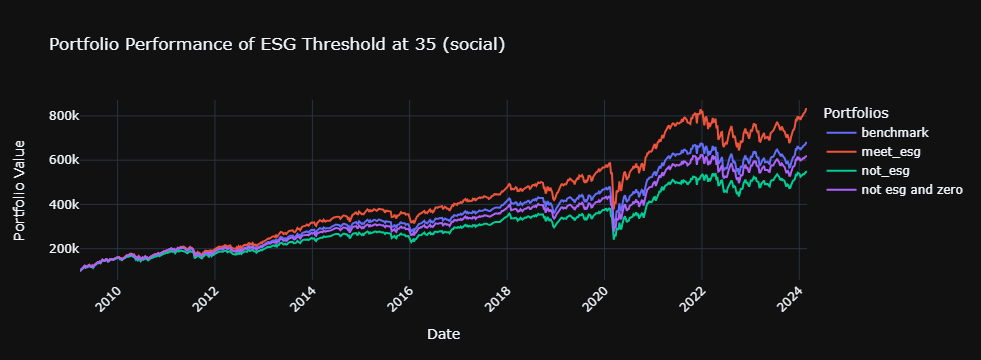


ESG Portfolio Metrics
Average Return (Per Annum): 1.151
Final Value: 831253.481


Non-ESG Portfolio Metrics
Average Return (Per Annum): 1.121
Final Value: 548040.271


Non-ESG/0-RRI Portfolio Metrics
Average Return (Per Annum): 1.13
Final Value: 619804.064


Benchmark Portfolio Metrics
Average Return (Per Annum): 1.136
Final Value: 678757.954



  0%|          | 0/780 [00:00<?, ?it/s]

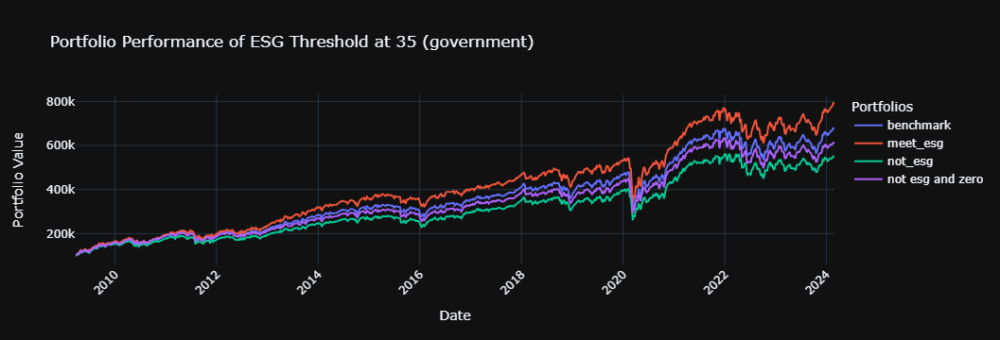


ESG Portfolio Metrics
Average Return (Per Annum): 1.147
Final Value: 793055.055


Non-ESG Portfolio Metrics
Average Return (Per Annum): 1.121
Final Value: 550612.864


Non-ESG/0-RRI Portfolio Metrics
Average Return (Per Annum): 1.129
Final Value: 613002.491


Benchmark Portfolio Metrics
Average Return (Per Annum): 1.136
Final Value: 678757.954



  0%|          | 0/780 [00:00<?, ?it/s]

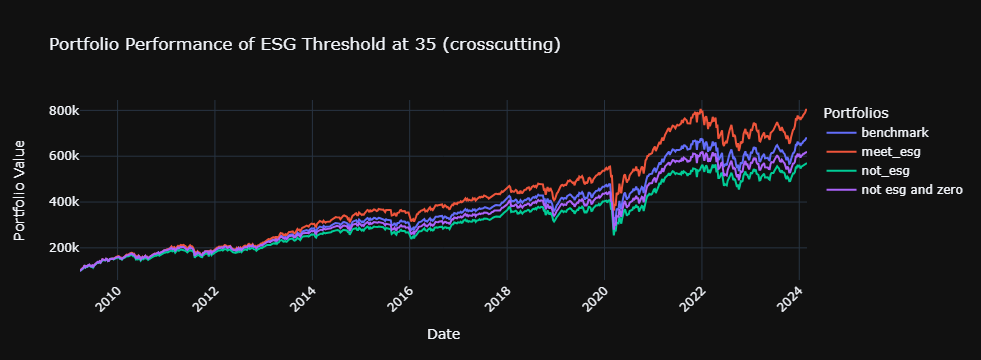


ESG Portfolio Metrics
Average Return (Per Annum): 1.148
Final Value: 803222.455


Non-ESG Portfolio Metrics
Average Return (Per Annum): 1.124
Final Value: 570413.794


Non-ESG/0-RRI Portfolio Metrics
Average Return (Per Annum): 1.13
Final Value: 619355.177


Benchmark Portfolio Metrics
Average Return (Per Annum): 1.136
Final Value: 678757.954



In [82]:
datelist = [datetime.strptime('2024-02-28', '%Y-%m-%d') - timedelta(days=x*7) for x in range(780)]
datelist.reverse()

THRESHOLD = 35 # fixed threshold for RRI score
PERCENTILE = 0.3 # top 30 percent companies in terms of ESG performance

# spx sectors
SECTORS = ['communications', 'consumer_discretionary', 'consumer_staples', 'energy', 'financials', 'health_care', 
           'industrials', 'information_technology', 'materials',  'real_estate', 'utilities']

# which metric to look at
METRICS = ['esg_score', 'environment', 'social', 'government', 'crosscutting']

# meet_esg - companies meeting esg criteria and RRI not zero
# not_esg - companies not meeting esg criteria and RRI not zero
# not_esg_zero - not_esg + companies with rri of 0
OPTIONS = ['meet_esg', 'not_esg', 'not_esg_zero', 'benchmark']

# all isins in S&P500 for given date
def generate_isin(date):
    return spx_const.get(date, [])
# all isins in specific sector in S&P500 for given date
# def generate_isin(date, sector):
#     isin_values = set()
#     for isin in spx_const[date]:
#         if spx_sector.get(isin, '') == sector:
#             isin_values.add(isin)
#     return isin_values

for metric in METRICS:
    portfolios = {x: {'account_value': 100000, 'holdings': {}, 'history': []} for x in OPTIONS}

    for i in tqdm(range(len(datelist))):
        # parse current date
        date = datelist[i].strftime('%Y-%m-%d') 
        date2 = pd.to_datetime(date)
    
        # sell all holdings of current date for each portfolio
        for x in OPTIONS:
            # sell each holding at last available price
            for isin in portfolios[x]['holdings']:
                portfolios[x]['account_value'] += float(portfolios[x]['holdings'][isin]) * float(spx_price[isin][spx_price[isin]['date'] <= date].iloc[-1]['close'])
            
            # clear all holdings
            portfolios[x]['holdings'] = {}
            
            # add new value to portfolio history
            portfolios[x]['history'].append(portfolios[x]['account_value'])
            
        for isin in generate_isin(date): # generate all isins to consider investing
            if not len(spx_esg.get(isin, [])):
                continue
            if not len(spx_price.get(isin, [])):
                continue
            if not len(spx_esg[isin].get(date2, [])): # if no data ignore
                continue
            if not len(spx_price[isin][spx_price[isin]['date'] <= date]):
                continue
            elif (spx_esg[isin][date2][metric] > THRESHOLD): # if esg metric is greater than threshold add it to non esg portfolios
                portfolios['not_esg']['holdings'][isin] = 0
                portfolios['not_esg_zero']['holdings'][isin] = 0
            elif (spx_esg[isin][date2][metric] == 0): # if esg metric is zero add to non_esg_zero portfolio
                portfolios['not_esg_zero']['holdings'][isin] = 0
            else: # add other investments to portfolio that meets esg metric requirements
                portfolios['meet_esg']['holdings'][isin] = 0
            portfolios['benchmark']['holdings'][isin] = 0 # benchmark portfolio
    
        for x in OPTIONS:
            cnt = len(portfolios[x]['holdings']) # number of holdings 
            if cnt == 0: continue
            val = portfolios[x]['account_value'] / cnt # value allocated to each investment // CURRENTLY USING EQUAL WEIGHTED WILL CHANGE TO MARKET CAP TOO
            
            # determine number of shares for each isin
            for isin in portfolios[x]['holdings']:
                portfolios[x]['holdings'][isin] = val/float(spx_price[isin][spx_price[isin]['date'] <= date].iloc[-1]['close'])
                portfolios[x]['account_value'] -= val
    
    # sell everything at the end
    for x in OPTIONS:
        # sell each holding at last available price
        for isin in portfolios[x]['holdings']:
            portfolios[x]['account_value'] += float(portfolios[x]['holdings'][isin]) * float(spx_price[isin][spx_price[isin]['date'] <= date].iloc[-1]['close'])
    
        # clear all holdings
        portfolios[x]['holdings'] = {}
        
        # add new value to portfolio history
        portfolios[x]['history'].append(portfolios[x]['account_value'])
        returns[f'SPX/{metric}/{x}'] = portfolios[x]['history']
        portfolios[x]['history'] = portfolios[x]['history'][1:]


    
    fig = make_subplots()
    
    fig.add_trace(go.Scatter(x=datelist, y=portfolios['benchmark']['history'], mode='lines', name='benchmark'))
    fig.add_trace(go.Scatter(x=datelist, y=portfolios['meet_esg']['history'], mode='lines', name='meet_esg'))
    fig.add_trace(go.Scatter(x=datelist, y=portfolios['not_esg']['history'], mode='lines', name='not_esg'))
    fig.add_trace(go.Scatter(x=datelist, y=portfolios['not_esg_zero']['history'], mode='lines', name='not esg and zero'))
                
    fig.update_layout(
        title=f'Portfolio Performance of ESG Threshold at 35 ({metric})',
        xaxis_title='Date',
        yaxis_title='Portfolio Value',
        legend_title='Portfolios',
        template='plotly_dark', # Set dark theme
        xaxis=dict(tickangle=-45) 
    )
    
    fig.show()

    def rd(x):
        return round(x, 3) 
        
    # Calculate sharpe ratio and returns
    def portfolioMetrics(history):
        risk_free_rate = 0.015
        annual_return = (history[-1]/history[0])**(1/(len(history)/52)) - 1
        annual_std = np.array([(history[i] - history[i - 1])/history[i - 1] for i in range(1, len(history))]).std() * np.sqrt(52)
        print(f"Average Return (Per Annum): {rd(((history[-1]/history[0])**(1/len(history)))**52)}")
        print(f"Final Value: {rd(history[-1])}\n")
    
    # Display Metrics
    print("\n\033[4mESG Portfolio Metrics\033[0m") 
    portfolioMetrics(portfolios['meet_esg']['history'])
    print("\n\033[4mNon-ESG Portfolio Metrics\033[0m")
    portfolioMetrics(portfolios['not_esg']['history'])
    print("\n\033[4mNon-ESG/0-RRI Portfolio Metrics\033[0m")
    portfolioMetrics(portfolios['not_esg_zero']['history'])
    print("\n\033[4mBenchmark Portfolio Metrics\033[0m")
    portfolioMetrics(portfolios['benchmark']['history'])

### Groupings by Financial/Utilities & Marketcap

  0%|          | 0/780 [00:00<?, ?it/s]

Financial & Utiliies Above Median Market Cap


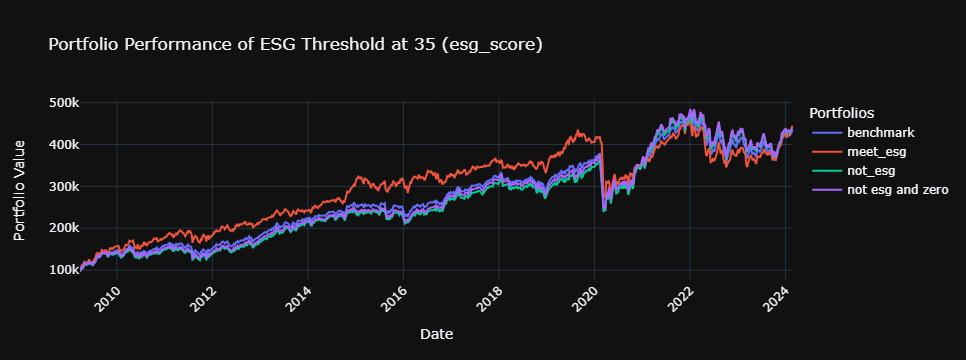


ESG Portfolio Metrics
Average Return (Per Annum): 1.104
Final Value: 442553.389


Non-ESG Portfolio Metrics
Average Return (Per Annum): 1.105
Final Value: 436047.558


Non-ESG/0-RRI Portfolio Metrics
Average Return (Per Annum): 1.105
Final Value: 436132.214


Benchmark Portfolio Metrics
Average Return (Per Annum): 1.104
Final Value: 431377.461



  0%|          | 0/780 [00:00<?, ?it/s]

Financial & Utiliies Above Median Market Cap


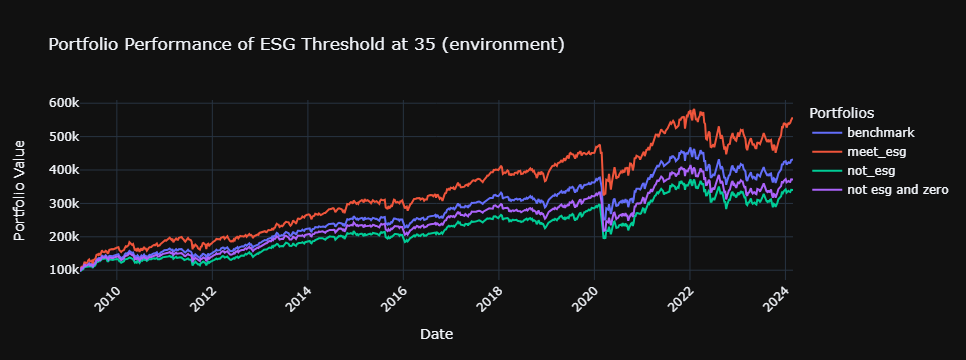


ESG Portfolio Metrics
Average Return (Per Annum): 1.122
Final Value: 555002.255


Non-ESG Portfolio Metrics
Average Return (Per Annum): 1.087
Final Value: 340299.605


Non-ESG/0-RRI Portfolio Metrics
Average Return (Per Annum): 1.093
Final Value: 371881.126


Benchmark Portfolio Metrics
Average Return (Per Annum): 1.104
Final Value: 431377.461



  0%|          | 0/780 [00:00<?, ?it/s]

Financial & Utiliies Above Median Market Cap


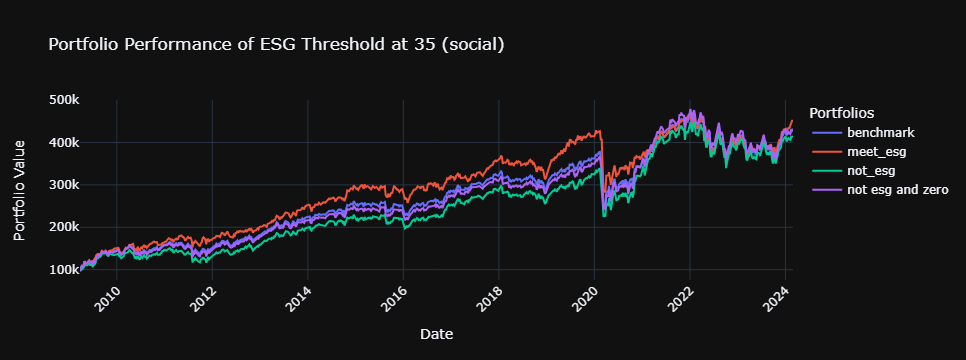


ESG Portfolio Metrics
Average Return (Per Annum): 1.105
Final Value: 451326.546


Non-ESG Portfolio Metrics
Average Return (Per Annum): 1.102
Final Value: 414373.757


Non-ESG/0-RRI Portfolio Metrics
Average Return (Per Annum): 1.104
Final Value: 427739.651


Benchmark Portfolio Metrics
Average Return (Per Annum): 1.104
Final Value: 431377.461



  0%|          | 0/780 [00:00<?, ?it/s]

Financial & Utiliies Above Median Market Cap


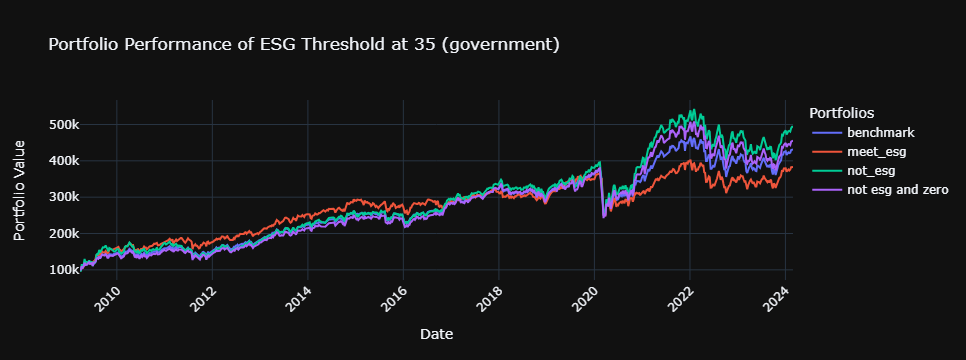


ESG Portfolio Metrics
Average Return (Per Annum): 1.096
Final Value: 382978.396


Non-ESG Portfolio Metrics
Average Return (Per Annum): 1.115
Final Value: 493787.486


Non-ESG/0-RRI Portfolio Metrics
Average Return (Per Annum): 1.107
Final Value: 455661.052


Benchmark Portfolio Metrics
Average Return (Per Annum): 1.104
Final Value: 431377.461



  0%|          | 0/780 [00:00<?, ?it/s]

Financial & Utiliies Above Median Market Cap


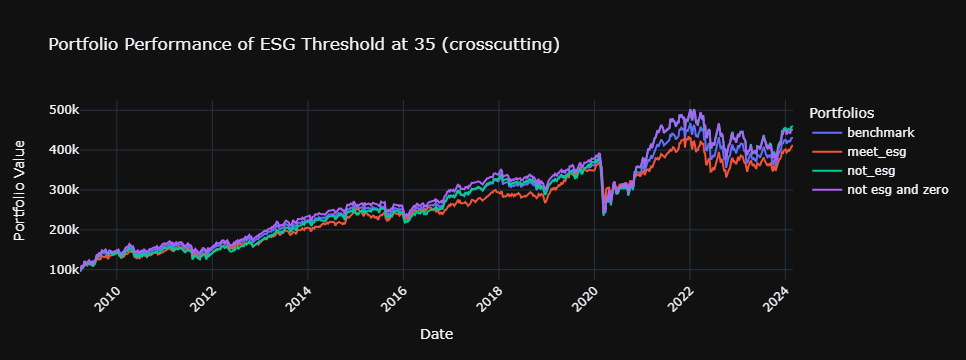


ESG Portfolio Metrics
Average Return (Per Annum): 1.099
Final Value: 410834.832


Non-ESG Portfolio Metrics
Average Return (Per Annum): 1.11
Final Value: 460320.441


Non-ESG/0-RRI Portfolio Metrics
Average Return (Per Annum): 1.108
Final Value: 451826.403


Benchmark Portfolio Metrics
Average Return (Per Annum): 1.104
Final Value: 431377.461



  0%|          | 0/780 [00:00<?, ?it/s]

Financial & Utiliies Below Median Market Cap


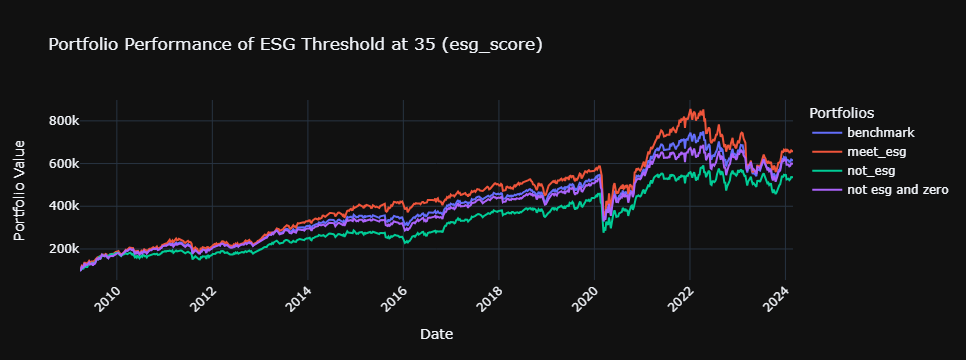


ESG Portfolio Metrics
Average Return (Per Annum): 1.131
Final Value: 657315.43


Non-ESG Portfolio Metrics
Average Return (Per Annum): 1.119
Final Value: 535712.647


Non-ESG/0-RRI Portfolio Metrics
Average Return (Per Annum): 1.129
Final Value: 598500.312


Benchmark Portfolio Metrics
Average Return (Per Annum): 1.13
Final Value: 615819.937



  0%|          | 0/780 [00:00<?, ?it/s]

Financial & Utiliies Below Median Market Cap


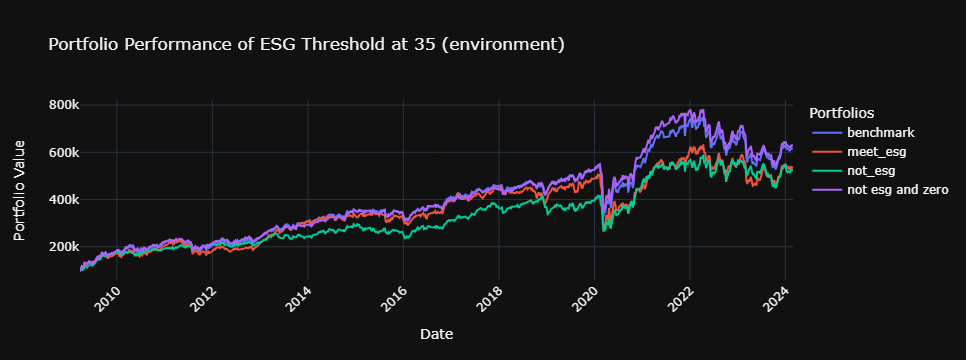


ESG Portfolio Metrics
Average Return (Per Annum): 1.116
Final Value: 534850.049


Non-ESG Portfolio Metrics
Average Return (Per Annum): 1.118
Final Value: 523822.892


Non-ESG/0-RRI Portfolio Metrics
Average Return (Per Annum): 1.132
Final Value: 630375.508


Benchmark Portfolio Metrics
Average Return (Per Annum): 1.13
Final Value: 615819.937



  0%|          | 0/780 [00:00<?, ?it/s]

Financial & Utiliies Below Median Market Cap


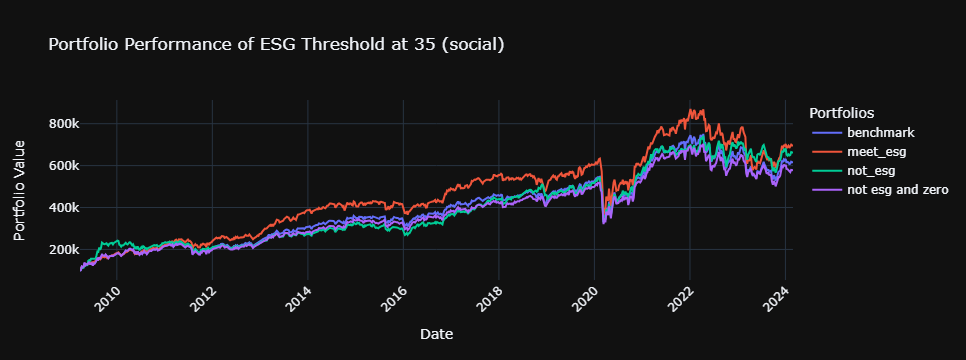


ESG Portfolio Metrics
Average Return (Per Annum): 1.135
Final Value: 695757.231


Non-ESG Portfolio Metrics
Average Return (Per Annum): 1.136
Final Value: 662695.644


Non-ESG/0-RRI Portfolio Metrics
Average Return (Per Annum): 1.126
Final Value: 578118.637


Benchmark Portfolio Metrics
Average Return (Per Annum): 1.13
Final Value: 615819.937



  0%|          | 0/780 [00:00<?, ?it/s]

Financial & Utiliies Below Median Market Cap


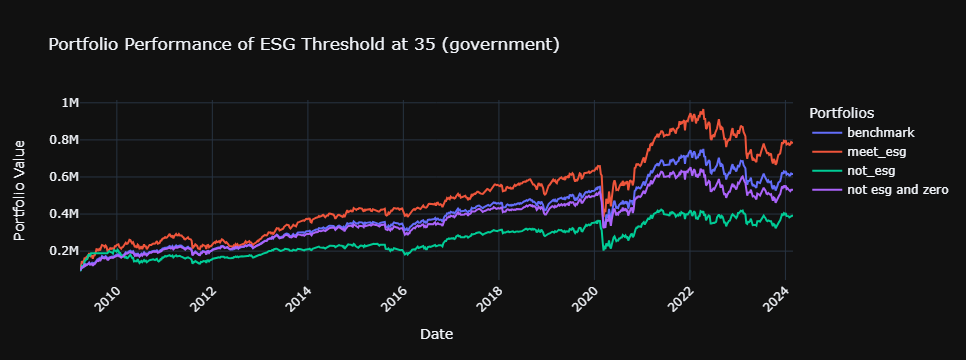


ESG Portfolio Metrics
Average Return (Per Annum): 1.138
Final Value: 782882.056


Non-ESG Portfolio Metrics
Average Return (Per Annum): 1.101
Final Value: 391494.89


Non-ESG/0-RRI Portfolio Metrics
Average Return (Per Annum): 1.12
Final Value: 531151.612


Benchmark Portfolio Metrics
Average Return (Per Annum): 1.13
Final Value: 615819.937



  0%|          | 0/780 [00:00<?, ?it/s]

Financial & Utiliies Below Median Market Cap


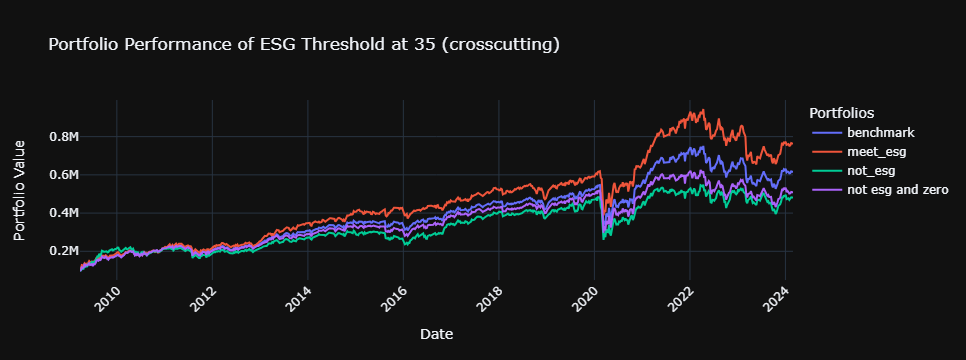


ESG Portfolio Metrics
Average Return (Per Annum): 1.139
Final Value: 762485.666


Non-ESG Portfolio Metrics
Average Return (Per Annum): 1.112
Final Value: 481206.131


Non-ESG/0-RRI Portfolio Metrics
Average Return (Per Annum): 1.117
Final Value: 508717.769


Benchmark Portfolio Metrics
Average Return (Per Annum): 1.13
Final Value: 615819.937



  0%|          | 0/780 [00:00<?, ?it/s]

Others Above Median Market Cap


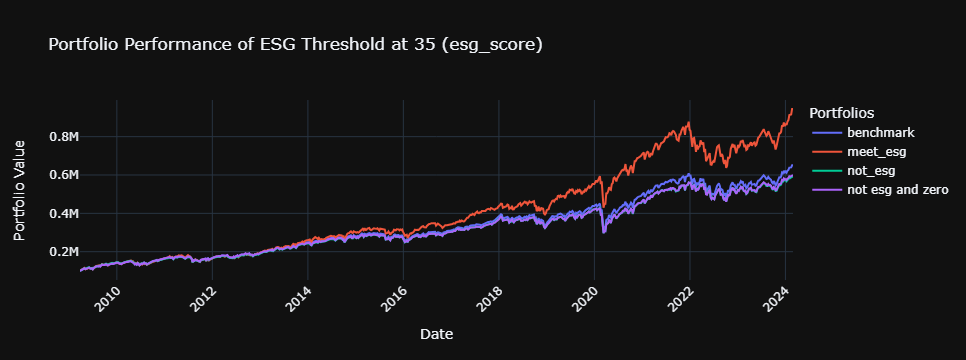


ESG Portfolio Metrics
Average Return (Per Annum): 1.16
Final Value: 944229.864


Non-ESG Portfolio Metrics
Average Return (Per Annum): 1.126
Final Value: 592746.79


Non-ESG/0-RRI Portfolio Metrics
Average Return (Per Annum): 1.127
Final Value: 599678.806


Benchmark Portfolio Metrics
Average Return (Per Annum): 1.133
Final Value: 650658.485



  0%|          | 0/780 [00:00<?, ?it/s]

Others Above Median Market Cap


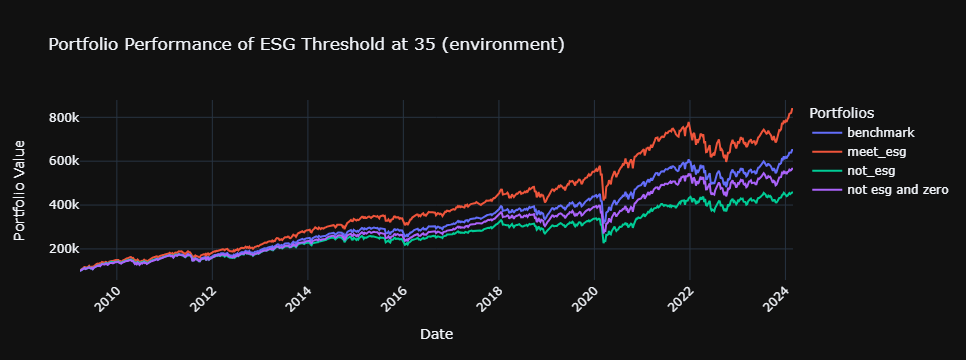


ESG Portfolio Metrics
Average Return (Per Annum): 1.151
Final Value: 837947.671


Non-ESG Portfolio Metrics
Average Return (Per Annum): 1.107
Final Value: 457804.645


Non-ESG/0-RRI Portfolio Metrics
Average Return (Per Annum): 1.123
Final Value: 565679.359


Benchmark Portfolio Metrics
Average Return (Per Annum): 1.133
Final Value: 650658.485



  0%|          | 0/780 [00:00<?, ?it/s]

Others Above Median Market Cap



ESG Portfolio Metrics
Average Return (Per Annum): 1.158
Final Value: 912010.239


Non-ESG Portfolio Metrics
Average Return (Per Annum): 1.118
Final Value: 532514.591


Non-ESG/0-RRI Portfolio Metrics
Average Return (Per Annum): 1.123
Final Value: 564518.711


Benchmark Portfolio Metrics
Average Return (Per Annum): 1.133
Final Value: 650658.485



  0%|          | 0/780 [00:00<?, ?it/s]

Others Above Median Market Cap



ESG Portfolio Metrics
Average Return (Per Annum): 1.151
Final Value: 826195.931


Non-ESG Portfolio Metrics
Average Return (Per Annum): 1.122
Final Value: 557475.38


Non-ESG/0-RRI Portfolio Metrics
Average Return (Per Annum): 1.124
Final Value: 577064.042


Benchmark Portfolio Metrics
Average Return (Per Annum): 1.133
Final Value: 650658.485



  0%|          | 0/780 [00:00<?, ?it/s]

Others Above Median Market Cap



ESG Portfolio Metrics
Average Return (Per Annum): 1.159
Final Value: 917414.802


Non-ESG Portfolio Metrics
Average Return (Per Annum): 1.121
Final Value: 549830.901


Non-ESG/0-RRI Portfolio Metrics
Average Return (Per Annum): 1.124
Final Value: 572155.22


Benchmark Portfolio Metrics
Average Return (Per Annum): 1.133
Final Value: 650658.485



  0%|          | 0/780 [00:00<?, ?it/s]

Others Below Median Market Cap



ESG Portfolio Metrics
Average Return (Per Annum): 1.17
Final Value: 1043839.808


Non-ESG Portfolio Metrics
Average Return (Per Annum): 1.146
Final Value: 766214.244


Non-ESG/0-RRI Portfolio Metrics
Average Return (Per Annum): 1.138
Final Value: 699585.996


Benchmark Portfolio Metrics
Average Return (Per Annum): 1.151
Final Value: 821228.858



  0%|          | 0/780 [00:00<?, ?it/s]

Others Below Median Market Cap



ESG Portfolio Metrics
Average Return (Per Annum): 1.135
Final Value: 660975.862


Non-ESG Portfolio Metrics
Average Return (Per Annum): 1.145
Final Value: 746177.22


Non-ESG/0-RRI Portfolio Metrics
Average Return (Per Annum): 1.164
Final Value: 985142.752


Benchmark Portfolio Metrics
Average Return (Per Annum): 1.151
Final Value: 821228.858



  0%|          | 0/780 [00:00<?, ?it/s]

Others Below Median Market Cap



ESG Portfolio Metrics
Average Return (Per Annum): 1.166
Final Value: 990719.507


Non-ESG Portfolio Metrics
Average Return (Per Annum): 1.144
Final Value: 752891.973


Non-ESG/0-RRI Portfolio Metrics
Average Return (Per Annum): 1.144
Final Value: 759914.735


Benchmark Portfolio Metrics
Average Return (Per Annum): 1.151
Final Value: 821228.858



  0%|          | 0/780 [00:00<?, ?it/s]

Others Below Median Market Cap



ESG Portfolio Metrics
Average Return (Per Annum): 1.173
Final Value: 1097439.233


Non-ESG Portfolio Metrics
Average Return (Per Annum): 1.146
Final Value: 777288.481


Non-ESG/0-RRI Portfolio Metrics
Average Return (Per Annum): 1.142
Final Value: 729397.776


Benchmark Portfolio Metrics
Average Return (Per Annum): 1.151
Final Value: 821228.858



  0%|          | 0/780 [00:00<?, ?it/s]

Others Below Median Market Cap



ESG Portfolio Metrics
Average Return (Per Annum): 1.163
Final Value: 966286.512


Non-ESG Portfolio Metrics
Average Return (Per Annum): 1.143
Final Value: 730812.728


Non-ESG/0-RRI Portfolio Metrics
Average Return (Per Annum): 1.142
Final Value: 738172.507


Benchmark Portfolio Metrics
Average Return (Per Annum): 1.151
Final Value: 821228.858



In [83]:
datelist = [datetime.strptime('2024-02-28', '%Y-%m-%d') - timedelta(days=x*7) for x in range(780)]
datelist.reverse()

THRESHOLD = 35 # fixed threshold for RRI score
PERCENTILE = 0.3 # top 30 percent companies in terms of ESG performance

# spx sectors
SECTORS = ['communications', 'consumer_discretionary', 'consumer_staples', 'energy', 'financials', 'health_care', 
           'industrials', 'information_technology', 'materials',  'real_estate', 'utilities']

# which metric to look at
METRICS = ['esg_score', 'environment', 'social', 'government', 'crosscutting']

# meet_esg - companies meeting esg criteria and RRI not zero
# not_esg - companies not meeting esg criteria and RRI not zero
# not_esg_zero - not_esg + companies with rri of 0
OPTIONS = ['meet_esg', 'not_esg', 'not_esg_zero', 'benchmark']

# all isins in S&P500 for given date
def generate_isin(date, financials=True, above=True):
    isin_values = set()
    for isin in spx_const.get(date, []):
        if spx_sector.get(isin, '') in ['financials', 'utilities']:
            if financials:
                isin_values.add(isin)
        else:
            if not financials:
                isin_values.add(isin)
    mc = [0]
    for isin in isin_values:
        if spx_mc.get(isin, {}).get(pd.to_datetime(date), {}).get('market_cap', 0) > 0:
            mc.append(spx_mc[isin][pd.to_datetime(date)]['market_cap'])
    mc.sort()
    threshold = mc[len(mc)//2]
    good_isin = set()
    for isin in isin_values:
        if above:
            if spx_mc.get(isin, {}).get(pd.to_datetime(date), {}).get('market_cap', 0) > threshold:
                good_isin.add(isin)
        else:
            if spx_mc.get(isin, {}).get(pd.to_datetime(date), {}).get('market_cap', 0) <= threshold:
                good_isin.add(isin)
    return good_isin

for p1 in [True, False]:
    for p2 in [True, False]:    
        for metric in METRICS:
            portfolios = {x: {'account_value': 100000, 'holdings': {}, 'history': []} for x in OPTIONS}
            
            for i in tqdm(range(len(datelist))):
                # parse current date
                date = datelist[i].strftime('%Y-%m-%d') 
                date2 = pd.to_datetime(date)
            
                # sell all holdings of current date for each portfolio
                for x in OPTIONS:
                    # sell each holding at last available price
                    for isin in portfolios[x]['holdings']:
                        portfolios[x]['account_value'] += float(portfolios[x]['holdings'][isin]) * float(spx_price[isin][spx_price[isin]['date'] <= date].iloc[-1]['close'])
                    
                    # clear all holdings
                    portfolios[x]['holdings'] = {}
                    
                    # add new value to portfolio history
                    portfolios[x]['history'].append(portfolios[x]['account_value'])
                    
                for isin in generate_isin(date, p1, p2): # generate all isins to consider investing
                    if not len(spx_esg.get(isin, [])):
                        continue
                    if not len(spx_price.get(isin, [])):
                        continue
                    if not len(spx_esg[isin].get(date2, [])): # if no data ignore
                        continue
                    if not len(spx_price[isin][spx_price[isin]['date'] <= date]):
                        continue
                    elif (spx_esg[isin][date2][metric] > THRESHOLD): # if esg metric is greater than threshold add it to non esg portfolios
                        portfolios['not_esg']['holdings'][isin] = 0
                        portfolios['not_esg_zero']['holdings'][isin] = 0
                    elif (spx_esg[isin][date2][metric] == 0): # if esg metric is zero add to non_esg_zero portfolio
                        portfolios['not_esg_zero']['holdings'][isin] = 0
                    else: # add other investments to portfolio that meets esg metric requirements
                        portfolios['meet_esg']['holdings'][isin] = 0
                    portfolios['benchmark']['holdings'][isin] = 0 # benchmark portfolio
            
                for x in OPTIONS:
                    cnt = len(portfolios[x]['holdings']) # number of holdings 
                    if cnt == 0: continue
                    val = portfolios[x]['account_value'] / cnt # value allocated to each investment // CURRENTLY USING EQUAL WEIGHTED WILL CHANGE TO MARKET CAP TOO
                    
                    # determine number of shares for each isin
                    for isin in portfolios[x]['holdings']:
                        portfolios[x]['holdings'][isin] = val/float(spx_price[isin][spx_price[isin]['date'] <= date].iloc[-1]['close'])
                        portfolios[x]['account_value'] -= val
            
            # sell everything at the end
            for x in OPTIONS:
                # sell each holding at last available price
                for isin in portfolios[x]['holdings']:
                    portfolios[x]['account_value'] += float(portfolios[x]['holdings'][isin]) * float(spx_price[isin][spx_price[isin]['date'] <= date].iloc[-1]['close'])
            
                # clear all holdings
                portfolios[x]['holdings'] = {}
                
                # add new value to portfolio history
                portfolios[x]['history'].append(portfolios[x]['account_value'])
                portfolios[x]['history'] = portfolios[x]['history'][1:]
                title = f'SPX/{metric}/{x}'
                if p1:
                    title += '/Financial & Utilities'
                else:
                    title += '/Other'
                if p2:
                    title += '/Above Median Market Cap'
                else:
                    title += 'Below Median Market Cap'
                returns[title] = portfolios[x]['history']
                
            if p1 == True:
                print("Financial & Utiliies", end=" ")
            else:
                print("Others", end=" ")
            if p2 == True:
                print("Above Median Market Cap")
            else:
                print("Below Median Market Cap")
            
            fig = make_subplots()
            
            fig.add_trace(go.Scatter(x=datelist, y=portfolios['benchmark']['history'], mode='lines', name='benchmark'))
            fig.add_trace(go.Scatter(x=datelist, y=portfolios['meet_esg']['history'], mode='lines', name='meet_esg'))
            fig.add_trace(go.Scatter(x=datelist, y=portfolios['not_esg']['history'], mode='lines', name='not_esg'))
            fig.add_trace(go.Scatter(x=datelist, y=portfolios['not_esg_zero']['history'], mode='lines', name='not esg and zero'))
                        
            fig.update_layout(
                title=f'Portfolio Performance of ESG Threshold at 35 ({metric})',
                xaxis_title='Date',
                yaxis_title='Portfolio Value',
                legend_title='Portfolios',
                template='plotly_dark', # Set dark theme
                xaxis=dict(tickangle=-45) 
            )
            
            fig.show()

            def rd(x):
                return round(x, 3) 
                
            # Calculate sharpe ratio and returns
            def portfolioMetrics(history):
                risk_free_rate = 0.015
                annual_return = (history[-1]/history[0])**(1/(len(history)/52)) - 1
                annual_std = np.array([(history[i] - history[i - 1])/history[i - 1] for i in range(1, len(history))]).std() * np.sqrt(52)
                print(f"Average Return (Per Annum): {rd(((history[-1]/history[0])**(1/len(history)))**52)}")
                print(f"Final Value: {rd(history[-1])}\n")
            
            # Display Metrics
            print("\n\033[4mESG Portfolio Metrics\033[0m")
            portfolioMetrics(portfolios['meet_esg']['history'])
            print("\n\033[4mNon-ESG Portfolio Metrics\033[0m")
            portfolioMetrics(portfolios['not_esg']['history'])
            print("\n\033[4mNon-ESG/0-RRI Portfolio Metrics\033[0m")
            portfolioMetrics(portfolios['not_esg_zero']['history'])
            print("\n\033[4mBenchmark Portfolio Metrics\033[0m")
            portfolioMetrics(portfolios['benchmark']['history'])

## Eurostoxx Analysis

### Sectoral and Overall Performance

  0%|          | 0/780 [00:00<?, ?it/s]

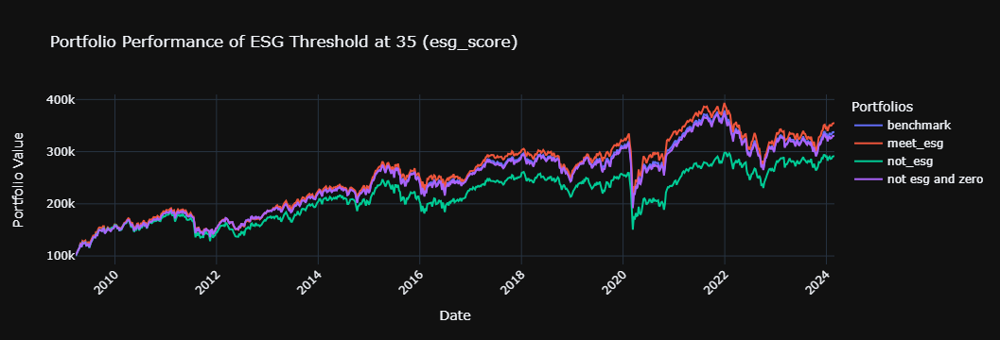


ESG Portfolio Metrics
Sharpe Ratio: 0.391
Max Drawdown: 71.499%
Average Return (Per Annum): 1.087
Final Value: 354856.604


Non-ESG Portfolio Metrics
Sharpe Ratio: 0.294
Max Drawdown: 65.69%
Average Return (Per Annum): 1.074
Final Value: 291757.231


Non-ESG/0-RRI Portfolio Metrics
Sharpe Ratio: 0.359
Max Drawdown: 69.426%
Average Return (Per Annum): 1.082
Final Value: 330358.262


Benchmark Portfolio Metrics
Sharpe Ratio: 0.369
Max Drawdown: 70.092%
Average Return (Per Annum): 1.084
Final Value: 337793.107



  0%|          | 0/780 [00:00<?, ?it/s]

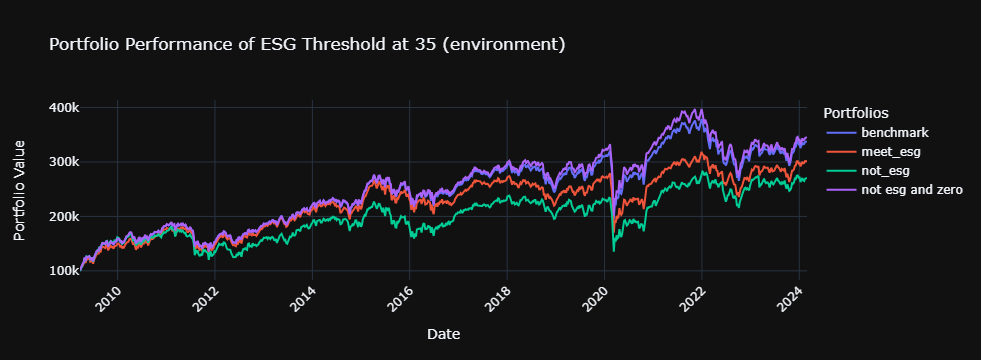


ESG Portfolio Metrics
Sharpe Ratio: 0.331
Max Drawdown: 66.749%
Average Return (Per Annum): 1.076
Final Value: 301566.986


Non-ESG Portfolio Metrics
Sharpe Ratio: 0.256
Max Drawdown: 63.152%
Average Return (Per Annum): 1.069
Final Value: 270656.604


Non-ESG/0-RRI Portfolio Metrics
Sharpe Ratio: 0.375
Max Drawdown: 70.734%
Average Return (Per Annum): 1.085
Final Value: 345533.496


Benchmark Portfolio Metrics
Sharpe Ratio: 0.369
Max Drawdown: 70.092%
Average Return (Per Annum): 1.084
Final Value: 337793.107



  0%|          | 0/780 [00:00<?, ?it/s]

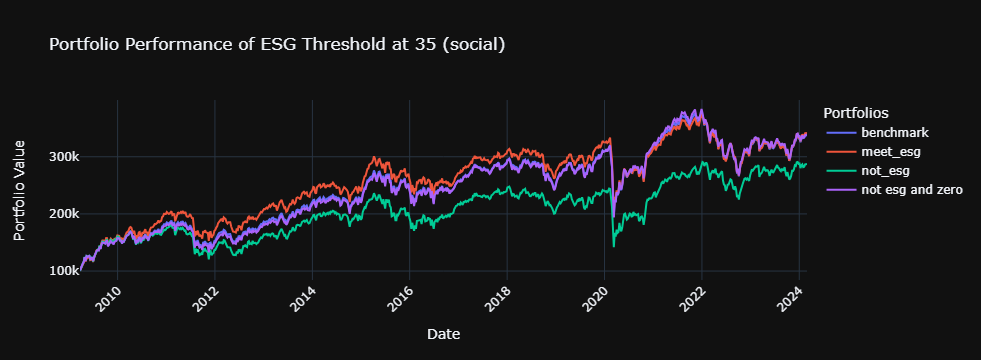


ESG Portfolio Metrics
Sharpe Ratio: 0.376
Max Drawdown: 70.567%
Average Return (Per Annum): 1.085
Final Value: 341621.367


Non-ESG Portfolio Metrics
Sharpe Ratio: 0.282
Max Drawdown: 65.174%
Average Return (Per Annum): 1.073
Final Value: 287442.027


Non-ESG/0-RRI Portfolio Metrics
Sharpe Ratio: 0.369
Max Drawdown: 70.18%
Average Return (Per Annum): 1.084
Final Value: 339018.009


Benchmark Portfolio Metrics
Sharpe Ratio: 0.369
Max Drawdown: 70.092%
Average Return (Per Annum): 1.084
Final Value: 337793.107



  0%|          | 0/780 [00:00<?, ?it/s]

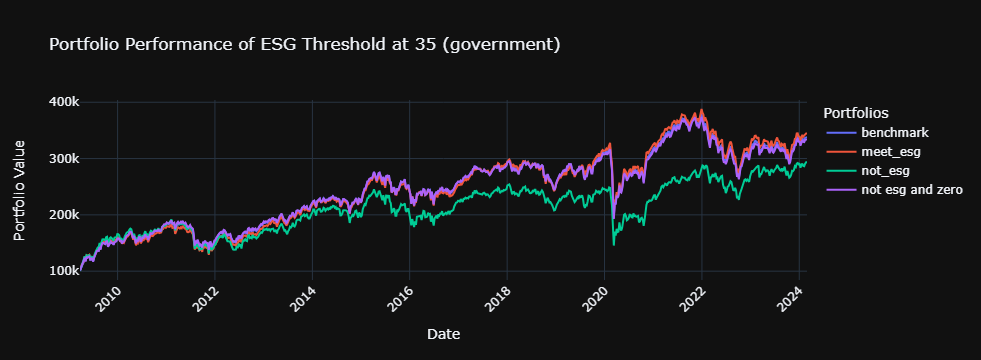


ESG Portfolio Metrics
Sharpe Ratio: 0.375
Max Drawdown: 70.605%
Average Return (Per Annum): 1.085
Final Value: 344581.943


Non-ESG Portfolio Metrics
Sharpe Ratio: 0.291
Max Drawdown: 65.814%
Average Return (Per Annum): 1.074
Final Value: 293350.827


Non-ESG/0-RRI Portfolio Metrics
Sharpe Ratio: 0.365
Max Drawdown: 69.786%
Average Return (Per Annum): 1.083
Final Value: 334242.103


Benchmark Portfolio Metrics
Sharpe Ratio: 0.369
Max Drawdown: 70.092%
Average Return (Per Annum): 1.084
Final Value: 337793.107



  0%|          | 0/780 [00:00<?, ?it/s]

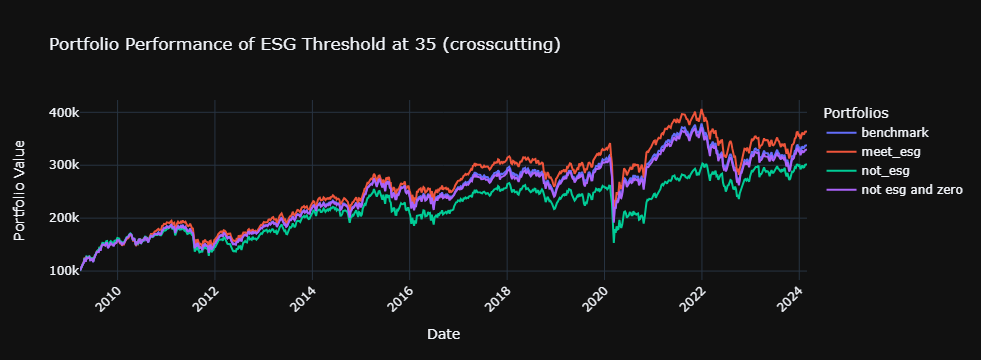


ESG Portfolio Metrics
Sharpe Ratio: 0.4
Max Drawdown: 72.277%
Average Return (Per Annum): 1.089
Final Value: 363865.758


Non-ESG Portfolio Metrics
Sharpe Ratio: 0.305
Max Drawdown: 66.852%
Average Return (Per Annum): 1.076
Final Value: 302066.937


Non-ESG/0-RRI Portfolio Metrics
Sharpe Ratio: 0.359
Max Drawdown: 69.369%
Average Return (Per Annum): 1.082
Final Value: 329893.212


Benchmark Portfolio Metrics
Sharpe Ratio: 0.369
Max Drawdown: 70.092%
Average Return (Per Annum): 1.084
Final Value: 337793.107



In [84]:
datelist = [datetime.strptime('2024-02-28', '%Y-%m-%d') - timedelta(days=x*7) for x in range(780)]
datelist.reverse()

THRESHOLD = 35 # fixed threshold for RRI score
PERCENTILE = 0.3 # top 30 percent companies in terms of ESG performance

# spx sectors
SECTORS = ['communications', 'consumer_discretionary', 'consumer_staples', 'energy', 'financials', 'health_care', 
           'industrials', 'information_technology', 'materials',  'real_estate', 'utilities']

# which metric to look at
METRICS = ['esg_score', 'environment', 'social', 'government', 'crosscutting']

# meet_esg - companies meeting esg criteria and RRI not zero
# not_esg - companies not meeting esg criteria and RRI not zero
# not_esg_zero - not_esg + companies with rri of 0
OPTIONS = ['meet_esg', 'not_esg', 'not_esg_zero', 'benchmark']

# all isins in S&P500 for given date
def generate_isin(date):
    return euro_const.get(date, [])
# all isins in specific sector in S&P500 for given date
# def generate_isin(date, sector):
#     isin_values = set()
#     for isin in spx_const[date]:
#         if spx_sector.get(isin, '') == sector:
#             isin_values.add(isin)
#     return isin_values

for metric in METRICS:
    portfolios = {x: {'account_value': 100000, 'holdings': {}, 'history': []} for x in OPTIONS}

    for i in tqdm(range(len(datelist))):
        # parse current date
        date = datelist[i].strftime('%Y-%m-%d') 
        date2 = pd.to_datetime(date)
    
        # sell all holdings of current date for each portfolio
        for x in OPTIONS:
            # sell each holding at last available price
            for isin in portfolios[x]['holdings']:
                portfolios[x]['account_value'] += float(portfolios[x]['holdings'][isin]) * float(euro_price[isin][euro_price[isin]['date'] <= date].iloc[-1]['close'])
            
            # clear all holdings
            portfolios[x]['holdings'] = {}
            
            # add new value to portfolio history
            portfolios[x]['history'].append(portfolios[x]['account_value'])
            
        for isin in generate_isin(date): # generate all isins to consider investing
            if not len(euro_esg.get(isin, [])):
                continue
            if not len(euro_price.get(isin, [])):
                continue
            if not len(euro_esg[isin].get(date2, [])): # if no data ignore
                continue
            if not len(euro_price[isin][euro_price[isin]['date'] <= date]):
                continue
            elif (euro_esg[isin][date2][metric] > THRESHOLD): # if esg metric is greater than threshold add it to non esg portfolios
                portfolios['not_esg']['holdings'][isin] = 0
                portfolios['not_esg_zero']['holdings'][isin] = 0
            elif (euro_esg[isin][date2][metric] == 0): # if esg metric is zero add to non_esg_zero portfolio
                portfolios['not_esg_zero']['holdings'][isin] = 0
            else: # add other investments to portfolio that meets esg metric requirements
                portfolios['meet_esg']['holdings'][isin] = 0
            portfolios['benchmark']['holdings'][isin] = 0 # benchmark portfolio
    
        for x in OPTIONS:
            cnt = len(portfolios[x]['holdings']) # number of holdings 
            if cnt == 0: continue
            val = portfolios[x]['account_value'] / cnt # value allocated to each investment // CURRENTLY USING EQUAL WEIGHTED WILL CHANGE TO MARKET CAP TOO
            
            # determine number of shares for each isin
            for isin in portfolios[x]['holdings']:
                portfolios[x]['holdings'][isin] = val/float(euro_price[isin][euro_price[isin]['date'] <= date].iloc[-1]['close'])
                portfolios[x]['account_value'] -= val
    
    # sell everything at the end
    for x in OPTIONS:
        # sell each holding at last available price
        for isin in portfolios[x]['holdings']:
            portfolios[x]['account_value'] += float(portfolios[x]['holdings'][isin]) * float(euro_price[isin][euro_price[isin]['date'] <= date].iloc[-1]['close'])
    
        # clear all holdings
        portfolios[x]['holdings'] = {}
        
        # add new value to portfolio history
        portfolios[x]['history'].append(portfolios[x]['account_value'])
        returns[f'EURO/{metric}/{x}'] = portfolios[x]['history']
        portfolios[x]['history'] = portfolios[x]['history'][1:]


    fig = make_subplots()
    
    fig.add_trace(go.Scatter(x=datelist, y=portfolios['benchmark']['history'], mode='lines', name='benchmark'))
    fig.add_trace(go.Scatter(x=datelist, y=portfolios['meet_esg']['history'], mode='lines', name='meet_esg'))
    fig.add_trace(go.Scatter(x=datelist, y=portfolios['not_esg']['history'], mode='lines', name='not_esg'))
    fig.add_trace(go.Scatter(x=datelist, y=portfolios['not_esg_zero']['history'], mode='lines', name='not esg and zero'))
                
    fig.update_layout(
        title=f'Portfolio Performance of ESG Threshold at 35 ({metric})',
        xaxis_title='Date',
        yaxis_title='Portfolio Value',
        legend_title='Portfolios',
        template='plotly_dark', # Set dark theme
        xaxis=dict(tickangle=-45) 
    )
    
    fig.show()
    
    def rd(x):
        return round(x, 3) 
        
    # Calculate sharpe ratio and returns
    def portfolioMetrics(history):
        portfolio_returns = np.array([history[i]/history[i - 1] for i in range(len(history))])
        mx = 1
        mdd = 0
        for i in range(len(portfolio_returns.cumprod())):
            if portfolio_returns[i] > mx:
                mx = portfolio_returns[i]
            mdd = max(mdd, mx - portfolio_returns[i])
        
        risk_free_rate = 0.015
        annual_return = (history[-1]/history[0])**(1/(len(history)/52)) - 1
        annual_std = np.array([(history[i] - history[i - 1])/history[i - 1] for i in range(1, len(history))]).std() * np.sqrt(52)
        print(f"Sharpe Ratio: {rd((annual_return - risk_free_rate)/annual_std)}")
        print(f"Max Drawdown: {rd(mdd*100)}%")
        print(f"Average Return (Per Annum): {rd(((history[-1]/history[0])**(1/len(history)))**52)}")
        print(f"Final Value: {rd(history[-1])}\n")
    
    # Display Metrics
    print("\n\033[4mESG Portfolio Metrics\033[0m") 
    portfolioMetrics(portfolios['meet_esg']['history'])
    print("\n\033[4mNon-ESG Portfolio Metrics\033[0m")
    portfolioMetrics(portfolios['not_esg']['history'])
    print("\n\033[4mNon-ESG/0-RRI Portfolio Metrics\033[0m")
    portfolioMetrics(portfolios['not_esg_zero']['history'])
    print("\n\033[4mBenchmark Portfolio Metrics\033[0m")
    portfolioMetrics(portfolios['benchmark']['history'])

### Groupings by Financial/Utilities & Marketcap

  0%|          | 0/780 [00:00<?, ?it/s]

Financial & Utiliies Above Median Market Cap


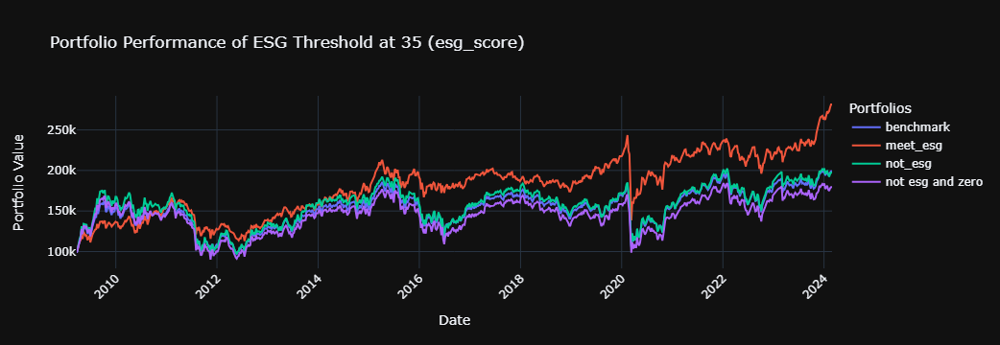


ESG Portfolio Metrics
Sharpe Ratio: 0.298
Average Return (Per Annum): 1.071
Final Value: 281365.714


Non-ESG Portfolio Metrics
Sharpe Ratio: 0.137
Average Return (Per Annum): 1.048
Final Value: 197334.725


Non-ESG/0-RRI Portfolio Metrics
Sharpe Ratio: 0.112
Average Return (Per Annum): 1.041
Final Value: 179403.871


Benchmark Portfolio Metrics
Sharpe Ratio: 0.151
Average Return (Per Annum): 1.048
Final Value: 199021.655



  0%|          | 0/780 [00:00<?, ?it/s]

Financial & Utiliies Above Median Market Cap


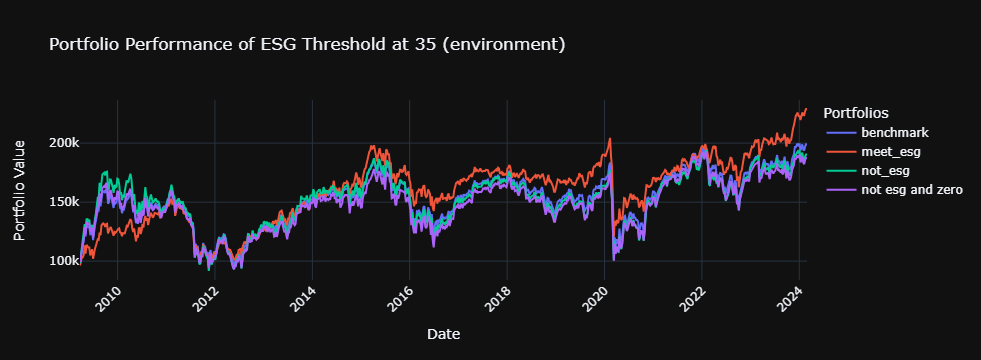


ESG Portfolio Metrics
Sharpe Ratio: 0.237
Average Return (Per Annum): 1.06
Final Value: 228949.965


Non-ESG Portfolio Metrics
Sharpe Ratio: 0.123
Average Return (Per Annum): 1.045
Final Value: 190433.283


Non-ESG/0-RRI Portfolio Metrics
Sharpe Ratio: 0.123
Average Return (Per Annum): 1.043
Final Value: 187552.38


Benchmark Portfolio Metrics
Sharpe Ratio: 0.151
Average Return (Per Annum): 1.048
Final Value: 199021.655



  0%|          | 0/780 [00:00<?, ?it/s]

Financial & Utiliies Above Median Market Cap


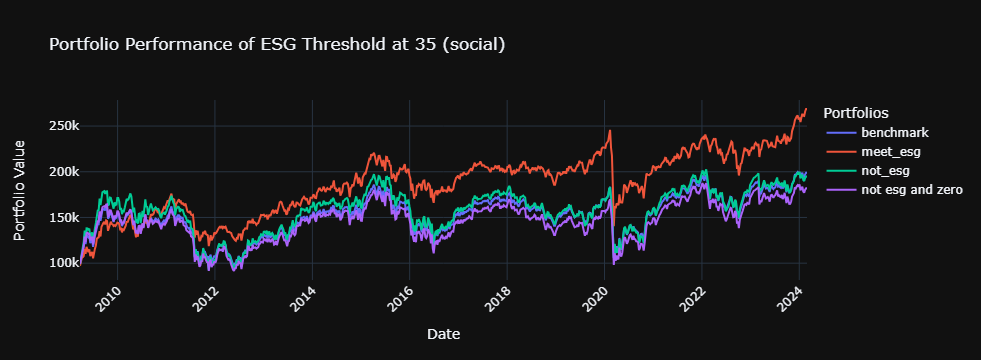


ESG Portfolio Metrics
Sharpe Ratio: 0.29
Average Return (Per Annum): 1.07
Final Value: 268645.959


Non-ESG Portfolio Metrics
Sharpe Ratio: 0.128
Average Return (Per Annum): 1.046
Final Value: 194928.66


Non-ESG/0-RRI Portfolio Metrics
Sharpe Ratio: 0.114
Average Return (Per Annum): 1.041
Final Value: 181882.524


Benchmark Portfolio Metrics
Sharpe Ratio: 0.151
Average Return (Per Annum): 1.048
Final Value: 199021.655



  0%|          | 0/780 [00:00<?, ?it/s]

Financial & Utiliies Above Median Market Cap


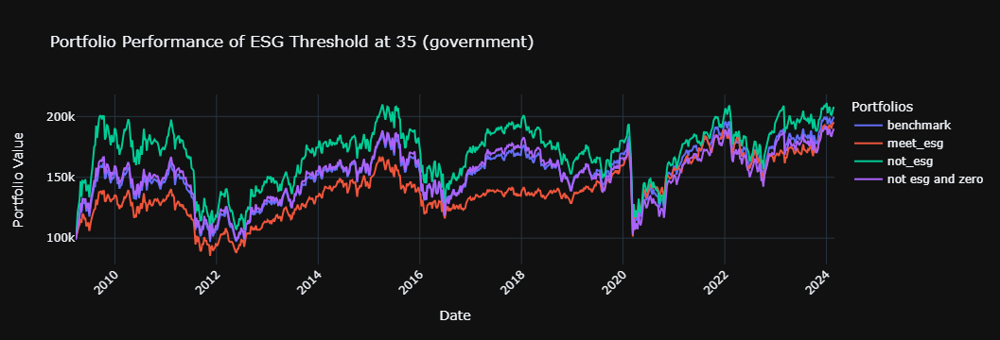


ESG Portfolio Metrics
Sharpe Ratio: 0.159
Average Return (Per Annum): 1.046
Final Value: 194741.723


Non-ESG Portfolio Metrics
Sharpe Ratio: 0.139
Average Return (Per Annum): 1.05
Final Value: 207273.01


Non-ESG/0-RRI Portfolio Metrics
Sharpe Ratio: 0.128
Average Return (Per Annum): 1.044
Final Value: 189304.001


Benchmark Portfolio Metrics
Sharpe Ratio: 0.151
Average Return (Per Annum): 1.048
Final Value: 199021.655



  0%|          | 0/780 [00:00<?, ?it/s]

Financial & Utiliies Above Median Market Cap


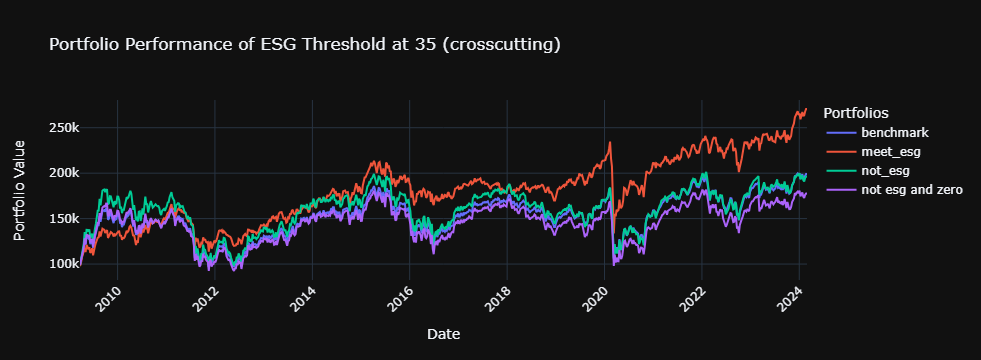


ESG Portfolio Metrics
Sharpe Ratio: 0.294
Average Return (Per Annum): 1.07
Final Value: 270613.534


Non-ESG Portfolio Metrics
Sharpe Ratio: 0.13
Average Return (Per Annum): 1.047
Final Value: 196336.669


Non-ESG/0-RRI Portfolio Metrics
Sharpe Ratio: 0.108
Average Return (Per Annum): 1.04
Final Value: 177626.241


Benchmark Portfolio Metrics
Sharpe Ratio: 0.151
Average Return (Per Annum): 1.048
Final Value: 199021.655



  0%|          | 0/780 [00:00<?, ?it/s]

Financial & Utiliies Below Median Market Cap


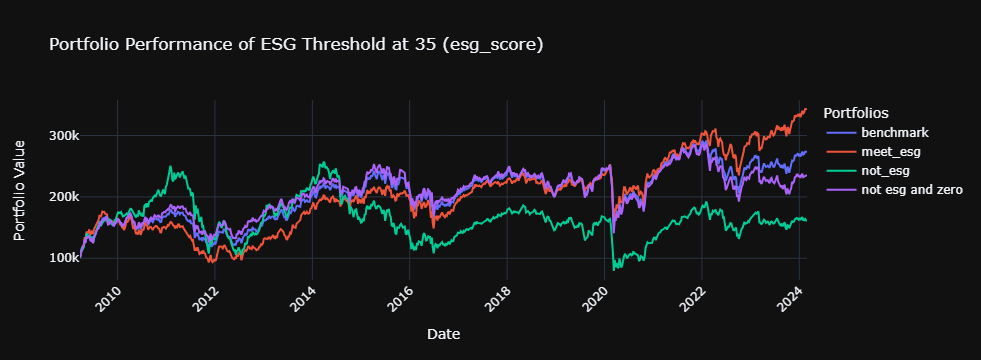


ESG Portfolio Metrics
Sharpe Ratio: 0.321
Average Return (Per Annum): 1.084
Final Value: 343142.171


Non-ESG Portfolio Metrics
Sharpe Ratio: 0.062
Average Return (Per Annum): 1.032
Final Value: 161634.468


Non-ESG/0-RRI Portfolio Metrics
Sharpe Ratio: 0.194
Average Return (Per Annum): 1.058
Final Value: 234943.123


Benchmark Portfolio Metrics
Sharpe Ratio: 0.25
Average Return (Per Annum): 1.068
Final Value: 273617.294



  0%|          | 0/780 [00:00<?, ?it/s]

Financial & Utiliies Below Median Market Cap


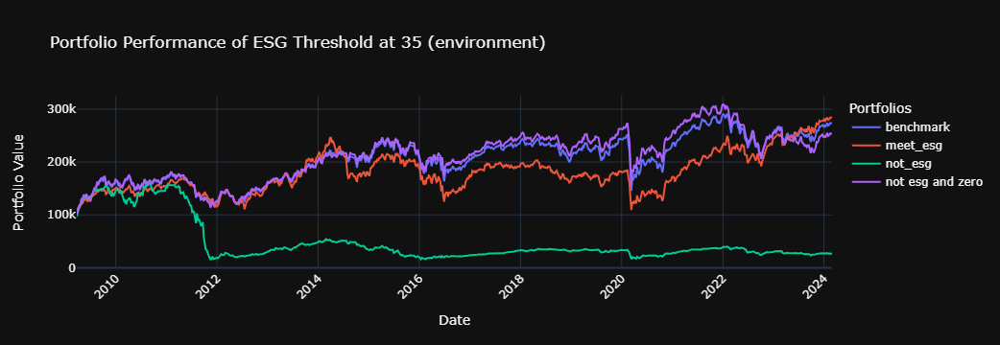


ESG Portfolio Metrics
Sharpe Ratio: 0.235
Average Return (Per Annum): 1.069
Final Value: 284636.678


Non-ESG Portfolio Metrics
Sharpe Ratio: -0.281
Average Return (Per Annum): 0.917
Final Value: 26489.629


Non-ESG/0-RRI Portfolio Metrics
Sharpe Ratio: 0.224
Average Return (Per Annum): 1.063
Final Value: 253504.022


Benchmark Portfolio Metrics
Sharpe Ratio: 0.25
Average Return (Per Annum): 1.068
Final Value: 273617.294



  0%|          | 0/780 [00:00<?, ?it/s]

Financial & Utiliies Below Median Market Cap


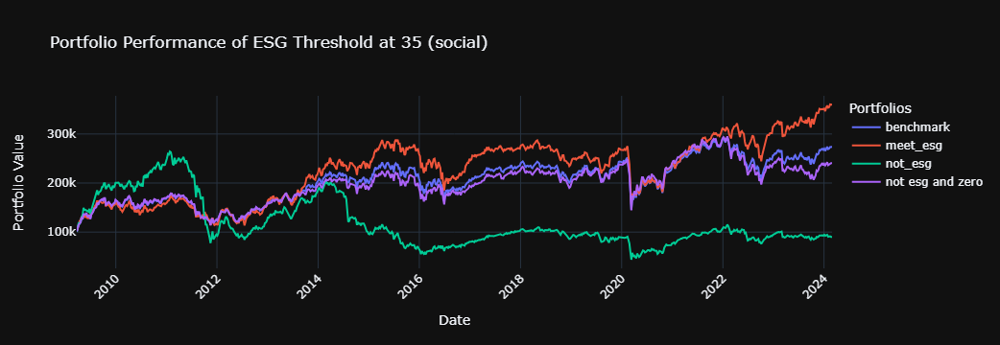


ESG Portfolio Metrics
Sharpe Ratio: 0.327
Average Return (Per Annum): 1.088
Final Value: 359452.202


Non-ESG Portfolio Metrics
Sharpe Ratio: -0.072
Average Return (Per Annum): 0.993
Final Value: 89978.085


Non-ESG/0-RRI Portfolio Metrics
Sharpe Ratio: 0.204
Average Return (Per Annum): 1.059
Final Value: 240514.564


Benchmark Portfolio Metrics
Sharpe Ratio: 0.25
Average Return (Per Annum): 1.068
Final Value: 273617.294



  0%|          | 0/780 [00:00<?, ?it/s]

Financial & Utiliies Below Median Market Cap


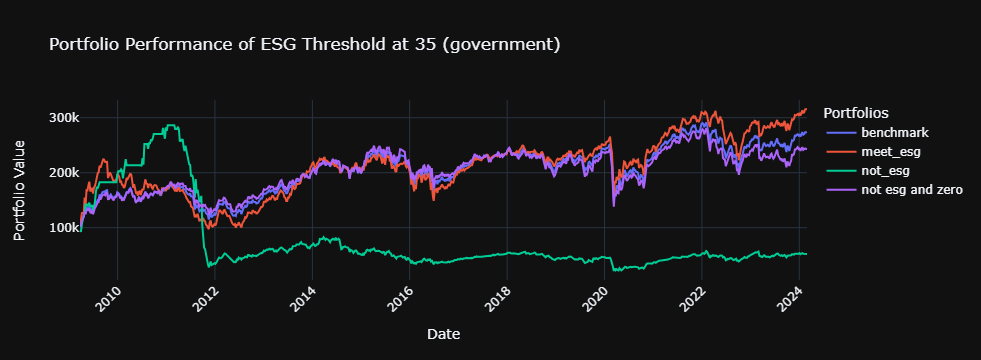


ESG Portfolio Metrics
Sharpe Ratio: 0.263
Average Return (Per Annum): 1.078
Final Value: 315864.088


Non-ESG Portfolio Metrics
Sharpe Ratio: -0.157
Average Return (Per Annum): 0.96
Final Value: 52365.015


Non-ESG/0-RRI Portfolio Metrics
Sharpe Ratio: 0.209
Average Return (Per Annum): 1.06
Final Value: 243265.044


Benchmark Portfolio Metrics
Sharpe Ratio: 0.25
Average Return (Per Annum): 1.068
Final Value: 273617.294



  0%|          | 0/780 [00:00<?, ?it/s]

Financial & Utiliies Below Median Market Cap


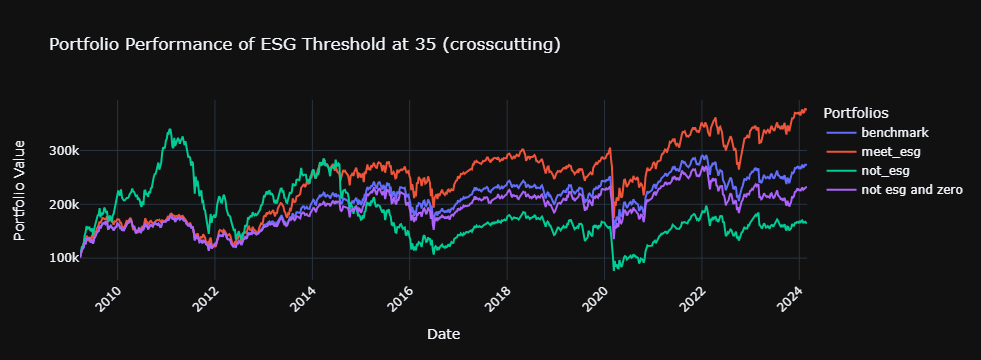


ESG Portfolio Metrics
Sharpe Ratio: 0.346
Average Return (Per Annum): 1.091
Final Value: 375929.305


Non-ESG Portfolio Metrics
Sharpe Ratio: 0.061
Average Return (Per Annum): 1.033
Final Value: 165536.886


Non-ESG/0-RRI Portfolio Metrics
Sharpe Ratio: 0.19
Average Return (Per Annum): 1.056
Final Value: 231505.2


Benchmark Portfolio Metrics
Sharpe Ratio: 0.25
Average Return (Per Annum): 1.068
Final Value: 273617.294



  0%|          | 0/780 [00:00<?, ?it/s]

Others Above Median Market Cap


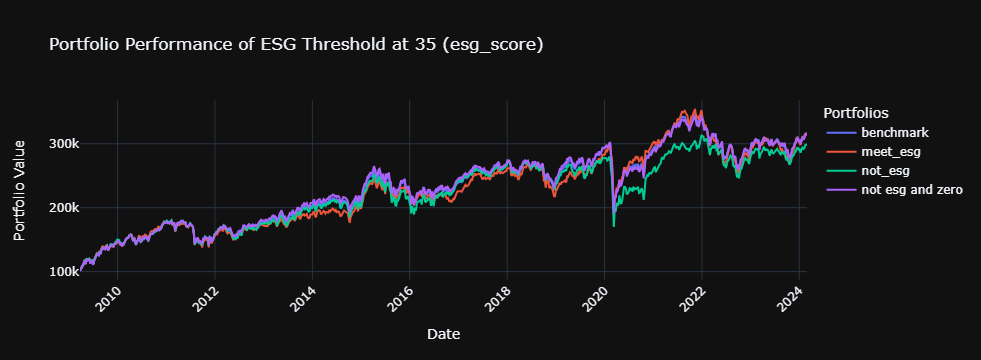


ESG Portfolio Metrics
Sharpe Ratio: 0.376
Average Return (Per Annum): 1.078
Final Value: 314767.905


Non-ESG Portfolio Metrics
Sharpe Ratio: 0.333
Average Return (Per Annum): 1.075
Final Value: 299312.665


Non-ESG/0-RRI Portfolio Metrics
Sharpe Ratio: 0.371
Average Return (Per Annum): 1.079
Final Value: 314518.324


Benchmark Portfolio Metrics
Sharpe Ratio: 0.377
Average Return (Per Annum): 1.079
Final Value: 316766.995



  0%|          | 0/780 [00:00<?, ?it/s]

Others Above Median Market Cap


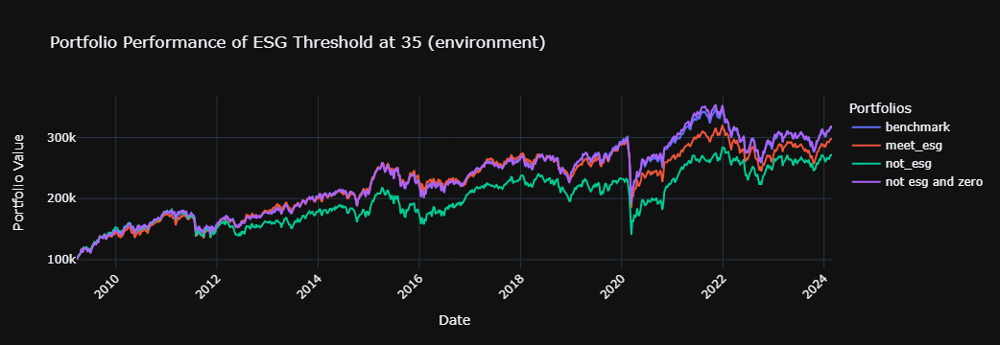


ESG Portfolio Metrics
Sharpe Ratio: 0.35
Average Return (Per Annum): 1.075
Final Value: 297504.254


Non-ESG Portfolio Metrics
Sharpe Ratio: 0.277
Average Return (Per Annum): 1.068
Final Value: 271517.037


Non-ESG/0-RRI Portfolio Metrics
Sharpe Ratio: 0.376
Average Return (Per Annum): 1.079
Final Value: 317956.219


Benchmark Portfolio Metrics
Sharpe Ratio: 0.377
Average Return (Per Annum): 1.079
Final Value: 316766.995



  0%|          | 0/780 [00:00<?, ?it/s]

Others Above Median Market Cap


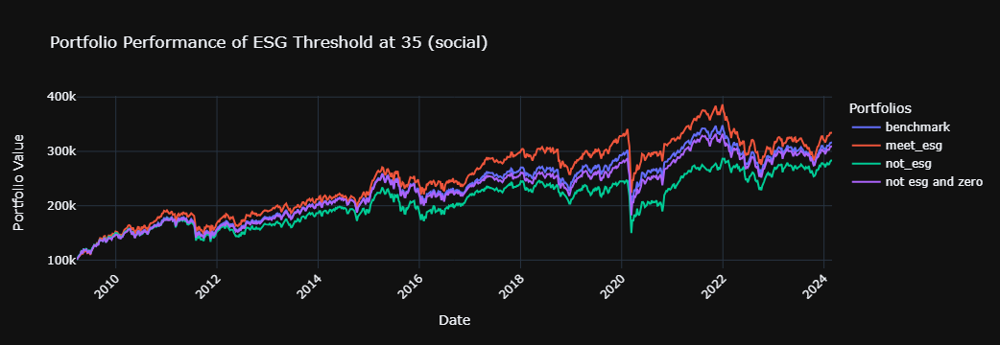


ESG Portfolio Metrics
Sharpe Ratio: 0.392
Average Return (Per Annum): 1.083
Final Value: 334297.259


Non-ESG Portfolio Metrics
Sharpe Ratio: 0.305
Average Return (Per Annum): 1.071
Final Value: 283328.816


Non-ESG/0-RRI Portfolio Metrics
Sharpe Ratio: 0.367
Average Return (Per Annum): 1.077
Final Value: 309772.064


Benchmark Portfolio Metrics
Sharpe Ratio: 0.377
Average Return (Per Annum): 1.079
Final Value: 316766.995



  0%|          | 0/780 [00:00<?, ?it/s]


KeyboardInterrupt



In [85]:
datelist = [datetime.strptime('2024-02-28', '%Y-%m-%d') - timedelta(days=x*7) for x in range(780)]
datelist.reverse()

THRESHOLD = 35 # fixed threshold for RRI score
PERCENTILE = 0.3 # top 30 percent companies in terms of ESG performance

# euro sectors
SECTORS = ['communications', 'consumer_discretionary', 'consumer_staples', 'energy', 'financials', 'health_care', 
           'industrials', 'information_technology', 'materials',  'real_estate', 'utilities']

# which metric to look at
METRICS = ['esg_score', 'environment', 'social', 'government', 'crosscutting']

# meet_esg - companies meeting esg criteria and RRI not zero
# not_esg - companies not meeting esg criteria and RRI not zero
# not_esg_zero - not_esg + companies with rri of 0
OPTIONS = ['meet_esg', 'not_esg', 'not_esg_zero', 'benchmark']

# all isins in S&P500 for given date
def generate_isin(date, financials=True, above=True):
    isin_values = set()
    for isin in euro_const.get(date, []):
        if euro_sector.get(isin, '') in ['Financials', 'Utilities']:
            if financials:
                isin_values.add(isin)
        else:
            if not financials:
                isin_values.add(isin)
    mc = [0]
    for isin in isin_values:
        if euro_mc.get(isin, {}).get(pd.to_datetime(date), {}).get('market_cap', 0) > 0:
            mc.append(euro_mc[isin][pd.to_datetime(date)]['market_cap'])
    mc.sort()
    threshold = mc[len(mc)//2]
    good_isin = set()
    for isin in isin_values:
        if above:
            if euro_mc.get(isin, {}).get(pd.to_datetime(date), {}).get('market_cap', 0) > threshold:
                good_isin.add(isin)
        else:
            if euro_mc.get(isin, {}).get(pd.to_datetime(date), {}).get('market_cap', 0) <= threshold:
                good_isin.add(isin)
    return good_isin
    
for p1 in [True, False]:
    for p2 in [True, False]:    
        for metric in METRICS:
            portfolios = {x: {'account_value': 100000, 'holdings': {}, 'history': []} for x in OPTIONS}
            
            for i in tqdm(range(len(datelist))):
                # parse current date
                date = datelist[i].strftime('%Y-%m-%d') 
                date2 = pd.to_datetime(date)
            
                # sell all holdings of current date for each portfolio
                for x in OPTIONS:
                    # sell each holding at last available price
                    for isin in portfolios[x]['holdings']:
                        portfolios[x]['account_value'] += float(portfolios[x]['holdings'][isin]) * float(euro_price[isin][euro_price[isin]['date'] <= date].iloc[-1]['close'])
                    
                    # clear all holdings
                    portfolios[x]['holdings'] = {}
                    
                    # add new value to portfolio history
                    portfolios[x]['history'].append(portfolios[x]['account_value'])
                    
                for isin in generate_isin(date, p1, p2): # generate all isins to consider investing
                    if not len(euro_esg.get(isin, [])):
                        continue
                    if not len(euro_price.get(isin, [])):
                        continue
                    if not len(euro_esg[isin].get(date2, [])): # if no data ignore
                        continue
                    if not len(euro_price[isin][euro_price[isin]['date'] <= date]):
                        continue
                    elif (euro_esg[isin][date2][metric] > THRESHOLD): # if esg metric is greater than threshold add it to non esg portfolios
                        portfolios['not_esg']['holdings'][isin] = 0
                        portfolios['not_esg_zero']['holdings'][isin] = 0
                    elif (euro_esg[isin][date2][metric] == 0): # if esg metric is zero add to non_esg_zero portfolio
                        portfolios['not_esg_zero']['holdings'][isin] = 0
                    else: # add other investments to portfolio that meets esg metric requirements
                        portfolios['meet_esg']['holdings'][isin] = 0
                    portfolios['benchmark']['holdings'][isin] = 0 # benchmark portfolio
            
                for x in OPTIONS:
                    cnt = len(portfolios[x]['holdings']) # number of holdings 
                    if cnt == 0: continue
                    val = portfolios[x]['account_value'] / cnt # value allocated to each investment // CURRENTLY USING EQUAL WEIGHTED WILL CHANGE TO MARKET CAP TOO
                    
                    # determine number of shares for each isin
                    for isin in portfolios[x]['holdings']:
                        portfolios[x]['holdings'][isin] = val/float(euro_price[isin][euro_price[isin]['date'] <= date].iloc[-1]['close'])
                        portfolios[x]['account_value'] -= val
            
            # sell everything at the end
            for x in OPTIONS:
                # sell each holding at last available price
                for isin in portfolios[x]['holdings']:
                    portfolios[x]['account_value'] += float(portfolios[x]['holdings'][isin]) * float(euro_price[isin][euro_price[isin]['date'] <= date].iloc[-1]['close'])
            
                # clear all holdings
                portfolios[x]['holdings'] = {}
                
                # add new value to portfolio history
                portfolios[x]['history'].append(portfolios[x]['account_value'])
                portfolios[x]['history'] = portfolios[x]['history'][1:]
                title = f'EURO/{metric}/{x}'
                if p1:
                    title += '/Financial & Utilities'
                else:
                    title += '/Other'
                if p2:
                    title += '/Above Median Market Cap'
                else:
                    title += '/Below Median Market Cap'
                returns[title] = portfolios[x]['history']
                
            if p1 == True:
                print("Financial & Utiliies", end=" ")
            else:
                print("Others", end=" ")
            if p2 == True:
                print("Above Median Market Cap")
            else:
                print("Below Median Market Cap")
            
            fig = make_subplots()
            
            fig.add_trace(go.Scatter(x=datelist, y=portfolios['benchmark']['history'], mode='lines', name='benchmark'))
            fig.add_trace(go.Scatter(x=datelist, y=portfolios['meet_esg']['history'], mode='lines', name='meet_esg'))
            fig.add_trace(go.Scatter(x=datelist, y=portfolios['not_esg']['history'], mode='lines', name='not_esg'))
            fig.add_trace(go.Scatter(x=datelist, y=portfolios['not_esg_zero']['history'], mode='lines', name='not esg and zero'))
                        
            fig.update_layout(
                title=f'Portfolio Performance of ESG Threshold at 35 ({metric})',
                xaxis_title='Date',
                yaxis_title='Portfolio Value',
                legend_title='Portfolios',
                template='plotly_dark', # Set dark theme
                xaxis=dict(tickangle=-45) 
            )
            
            fig.show()
            
            def rd(x):
                return round(x, 3) 
                
            # Calculate sharpe ratio and returns
            def portfolioMetrics(history):
                risk_free_rate = 0.015
                annual_return = (history[-1]/history[0])**(1/(len(history)/52)) - 1
                annual_std = np.array([(history[i] - history[i - 1])/history[i - 1] for i in range(1, len(history))]).std() * np.sqrt(52)
                print(f"Sharpe Ratio: {rd((annual_return - risk_free_rate)/annual_std)}")
                print(f"Average Return (Per Annum): {rd(((history[-1]/history[0])**(1/len(history)))**52)}")
                print(f"Final Value: {rd(history[-1])}\n")
            
            # Display Metrics
            print("\n\033[4mESG Portfolio Metrics\033[0m")
            portfolioMetrics(portfolios['meet_esg']['history'])
            print("\n\033[4mNon-ESG Portfolio Metrics\033[0m")
            portfolioMetrics(portfolios['not_esg']['history'])
            print("\n\033[4mNon-ESG/0-RRI Portfolio Metrics\033[0m")
            portfolioMetrics(portfolios['not_esg_zero']['history'])
            print("\n\033[4mBenchmark Portfolio Metrics\033[0m")
            portfolioMetrics(portfolios['benchmark']['history'])

# Final Results

In [30]:
import quantstats.stats

def _new_cagr(rets, rf=0.0, compounded=True, periods=252):
    x = ((rets + 1).cumprod() ** (1/((rets.index[-1] - rets.index[0]).days/365.25))) - 1
    return x.iloc[-1]['returns']

quantstats.stats.cagr = _new_cagr

In [31]:
for x in returns:
    if len(returns[x]) == 781:
        returns[x] = returns[x][1:]
returns = pd.DataFrame(returns)

In [61]:
titles = ['ESG F/U Above', 'not ESG F/U Above', 'Bench F/U Above', 
          'ESG F/U Below', 'not ESG F/U Below', 'Bench F/U Below',
          'ESG O Above', 'not ESG O Above', 'Bench O Above',
          'ESG O Below', 'not ESG O Below', 'Bench O Below',
          'Benchmark']
columns = [
            'SPX/esg_score/meet_esg/Financial & Utilities/Above Median Market Cap',
            'SPX/esg_score/not_esg/Financial & Utilities/Above Median Market Cap',
            'SPX/esg_score/benchmark/Financial & Utilities/Above Median Market Cap',
            'SPX/esg_score/meet_esg/Financial & UtilitiesBelow Median Market Cap',
            'SPX/esg_score/not_esg/Financial & UtilitiesBelow Median Market Cap', 
            'SPX/esg_score/benchmark/Financial & UtilitiesBelow Median Market Cap',
            'SPX/esg_score/meet_esg/Other/Above Median Market Cap',
            'SPX/esg_score/not_esg/Other/Above Median Market Cap',
            'SPX/esg_score/benchmark/Other/Above Median Market Cap',
            'SPX/esg_score/meet_esg/OtherBelow Median Market Cap',
            'SPX/esg_score/not_esg/OtherBelow Median Market Cap',
            'SPX/esg_score/benchmark/OtherBelow Median Market Cap',
            'SPX/esg_score/benchmark'
          ]
history = returns['SPX/esg_score/benchmark']
bench = pd.Series([(history.iloc[i]/history.iloc[i - 1] - 1) for i in range(500 + 1, len(history))])
bench = bench.set_axis(datelist[500 + 1:])
metrics = {}
rf = 0
for t, col in zip(titles, columns):
    history = returns[col][500:]
    ret = pd.Series([(history.iloc[i]/history.iloc[i - 1] - 1) for i in range(1, len(history))])
    ret = ret.set_axis(datelist[500 + 1:])

    win_rate = len(ret[ret > 0])/len(ret[ret != 0])
    sharpe = ((ret - rf).mean()/ret.std(ddof=1))*np.sqrt(52)
    sortino = ((ret - rf).mean()/(np.sqrt((ret[ret < 0] ** 2).sum() / len(ret))))*np.sqrt(52)
    information = (ret - bench).mean()/(ret - bench).std()
    rets = (ret + 1).cumprod()
    mx = rets.cummax()
    dds = rets/mx - 1
    
    metrics[t] = {}
    metrics[t]['Start Date'] = ret.index[0].strftime('%Y-%m-%d')
    metrics[t]['End Date'] = ret.index[-1].strftime('%Y-%m-%d')
    metrics[t]['Annual Return'] = rd(rets[-1] ** (1/(len(rets)/52)) - 1)
    metrics[t]['Win Rate (weekly)'] = rd(win_rate*100)
    metrics[t]['Sharpe'] = rd(sharpe)
    metrics[t]['Sortino'] = rd(sortino)
    metrics[t]['Information'] = rd(information)
    metrics[t]['Max Drawdown'] = rd(min(dds))

df = pd.DataFrame()
for t in titles:
    df = pd.concat([df, pd.DataFrame.from_dict(metrics[t], orient='index', columns=[t])], axis=1)
# print(tabulate(df, headers=titles, tablefmt="plain", numalign="right"))
print(df)

C:\Users\anish\AppData\Local\Temp\ipykernel_74556\779650064.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  metrics[t]['Annual Return'] = rd(rets[-1] ** (1/(len(rets)/52)) - 1)
C:\Users\anish\AppData\Local\Temp\ipykernel_74556\779650064.py:34: RuntimeWarning: invalid value encountered in double_scalars
  information = (ret - bench).mean()/(ret - bench).std()


                  ESG F/U Above not ESG F/U Above Bench F/U Above  \
Start Date           2018-10-31        2018-10-31      2018-10-31   
End Date             2024-02-28        2024-02-28      2024-02-28   
Annual Return           0.04639            0.0803         0.06725   
Win Rate (weekly)      57.45455          60.36364        60.14493   
Sharpe                  0.32885            0.4702         0.42377   
Sortino                 0.42215           0.63259         0.55787   
Information             -0.0689          -0.04403        -0.07498   
Max Drawdown           -0.36947          -0.34037        -0.34042   

                  ESG F/U Below not ESG F/U Below Bench F/U Below ESG O Above  \
Start Date           2018-10-31        2018-10-31      2018-10-31  2018-10-31   
End Date             2024-02-28        2024-02-28      2024-02-28  2024-02-28   
Annual Return            0.0566            0.0686         0.05886     0.16461   
Win Rate (weekly)      56.88406          57.24638     

In [44]:
titles = ['ESG F/U Above', 'not ESG F/U Above', 'Bench F/U Above', 
          'ESG F/U Below', 'not ESG F/U Below', 'Bench F/U Below',
          'ESG O Above', 'not ESG O Above', 'Bench O Above',
          'ESG O Below', 'not ESG O Below', 'Bench O Below',
          'Benchmark']
columns = [
            'EURO/esg_score/meet_esg/Financial & Utilities/Above Median Market Cap',
            'EURO/esg_score/not_esg/Financial & Utilities/Above Median Market Cap',
            'EURO/esg_score/benchmark/Financial & Utilities/Above Median Market Cap',
            'EURO/esg_score/meet_esg/Financial & Utilities/Below Median Market Cap',
            'EURO/esg_score/not_esg/Financial & Utilities/Below Median Market Cap', 
            'EURO/esg_score/benchmark/Financial & Utilities/Below Median Market Cap',
            'EURO/esg_score/meet_esg/Other/Above Median Market Cap',
            'EURO/esg_score/not_esg/Other/Above Median Market Cap',
            'EURO/esg_score/benchmark/Other/Above Median Market Cap',
            'EURO/esg_score/meet_esg/Other/Below Median Market Cap',
            'EURO/esg_score/not_esg/Other/Below Median Market Cap',
            'EURO/esg_score/benchmark/Other/Below Median Market Cap',
            'EURO/esg_score/benchmark'
          ]
history = returns['EURO/esg_score/benchmark']
bench = pd.Series([(history.iloc[i]/history.iloc[i - 1] - 1) for i in range(1, len(history))])
bench = bench.set_axis(datelist[1:])
metrics = {}
rf = 0
for t, col in zip(titles, columns):
    history = returns[col]
    ret = pd.Series([(history.iloc[i]/history.iloc[i - 1] - 1) for i in range(1, len(history))])
    ret = ret.set_axis(datelist[1:])

    win_rate = len(ret[ret > 0])/len(ret[ret != 0])
    sharpe = ((ret - rf).mean()/ret.std(ddof=1))*np.sqrt(52)
    sortino = ((ret - rf).mean()/(np.sqrt((ret[ret < 0] ** 2).sum() / len(ret))))*np.sqrt(52)
    information = (ret - bench).mean()/(ret - bench).std()
    rets = (ret + 1).cumprod()
    mx = rets.cummax()
    dds = rets/mx - 1
    
    metrics[t] = {}
    metrics[t]['Start Date'] = ret.index[0].strftime('%Y-%m-%d')
    metrics[t]['End Date'] = ret.index[-1].strftime('%Y-%m-%d')
    metrics[t]['Annual Return'] = rd(rets[-1] ** (1/(len(rets)/52)) - 1)
    metrics[t]['Win Rate (weekly)'] = rd(win_rate*100)
    metrics[t]['Sharpe'] = rd(sharpe)
    metrics[t]['Sortino'] = rd(sortino)
    metrics[t]['Information'] = rd(information)
    metrics[t]['Max Drawdown'] = rd(min(dds))

df = pd.DataFrame()
for t in titles:
    df = pd.concat([df, pd.DataFrame.from_dict(metrics[t], orient='index', columns=[t])], axis=1)
# print(tabulate(df, headers=titles, tablefmt="plain", numalign="right"))
print(df)

                  ESG F/U Above not ESG F/U Above Bench F/U Above  \
Start Date           2009-04-01        2009-04-01      2009-04-01   
End Date             2024-02-28        2024-02-28      2024-02-28   
Annual Return           0.07152           0.04758         0.04783   
Win Rate (weekly)      56.27426          55.56995        55.56995   
Sharpe                   0.4618           0.31551         0.32509   
Sortino                 0.63355           0.44765         0.45322   
Information             -0.0187          -0.03097         -0.0472   
Max Drawdown           -0.43153          -0.45954        -0.43101   

                  ESG F/U Below not ESG F/U Below Bench F/U Below ESG O Above  \
Start Date           2009-04-01        2009-04-01      2009-04-01  2009-04-01   
End Date             2024-02-28        2024-02-28      2024-02-28  2024-02-28   
Annual Return           0.08425           0.03245         0.06843     0.07859   
Win Rate (weekly)      54.31145          53.92535     

C:\Users\anish\AppData\Local\Temp\ipykernel_74556\2251888944.py:42: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  metrics[t]['Annual Return'] = rd(rets[-1] ** (1/(len(rets)/52)) - 1)
C:\Users\anish\AppData\Local\Temp\ipykernel_74556\2251888944.py:34: RuntimeWarning: invalid value encountered in double_scalars
  information = (ret - bench).mean()/(ret - bench).std()


In [62]:
# Counts of each group/sector in the S&P / EURO for a given date
count = {
        'spx_financials/utilities_above_meet_esg': [],
        'spx_financials/utilities_above_not_esg': [],
        'spx_financials/utilities_below_meet_esg': [],
        'spx_financials/utilities_below_not_esg': [],
        'spx_other_above_meet_esg': [],
        'spx_other_above_not_esg': [],
        'spx_other_below_meet_esg': [],
        'spx_other_below_not_esg': [],
        'euro_financials/utilities_above_meet_esg': [],
        'euro_financials/utilities_above_not_esg': [],
        'euro_financials/utilities_below_meet_esg': [],
        'euro_financials/utilities_below_not_esg': [],
        'euro_other_above_meet_esg': [],
        'euro_other_above_not_esg': [],
        'euro_other_below_meet_esg': [],
        'euro_other_below_not_esg': [],
        }

# all isins in S&P500 for given date
def generate_isin_euro(date, financials=True, above=True):
    isin_values = set()
    for isin in euro_const.get(date, []):
        if euro_sector.get(isin, '') in ['Financials', 'Utilities']:
            if financials:
                isin_values.add(isin)
        else:
            if not financials:
                isin_values.add(isin)
    mc = [0]
    for isin in isin_values:
        if euro_mc.get(isin, {}).get(pd.to_datetime(date), {}).get('market_cap', 0) > 0:
            mc.append(euro_mc[isin][pd.to_datetime(date)]['market_cap'])
    mc.sort()
    threshold = mc[len(mc)//2]
    good_isin = set()
    for isin in isin_values:
        if above:
            if euro_mc.get(isin, {}).get(pd.to_datetime(date), {}).get('market_cap', 0) > threshold:
                good_isin.add(isin)
        else:
            if euro_mc.get(isin, {}).get(pd.to_datetime(date), {}).get('market_cap', 0) <= threshold:
                good_isin.add(isin)
    return good_isin

def generate_isin_spx(date, financials=True, above=True):
    isin_values = set()
    for isin in spx_const.get(date, []):
        if spx_sector.get(isin, '') in ['financials', 'utilities']:
            if financials:
                isin_values.add(isin)
        else:
            if not financials:
                isin_values.add(isin)
    mc = [0]
    for isin in isin_values:
        if spx_mc.get(isin, {}).get(pd.to_datetime(date), {}).get('market_cap', 0) > 0:
            mc.append(spx_mc[isin][pd.to_datetime(date)]['market_cap'])
    mc.sort()
    threshold = mc[len(mc)//2]
    good_isin = set()
    for isin in isin_values:
        if above:
            if spx_mc.get(isin, {}).get(pd.to_datetime(date), {}).get('market_cap', 0) > threshold:
                good_isin.add(isin)
        else:
            if spx_mc.get(isin, {}).get(pd.to_datetime(date), {}).get('market_cap', 0) <= threshold:
                good_isin.add(isin)
    return good_isin

dates = []

for i in tqdm(range(len(datelist))):
    # parse current date
    date = datelist[i].strftime('%Y-%m-%d') 
    dates.append(date)
    date2 = pd.to_datetime(date)

    for p1 in [True, False]:
        for p2 in [True, False]:
            isins = generate_isin_euro(date, p1, p2)
            meet_esg = 0
            not_esg = 0
            for isin in isins:
                if not len(euro_esg.get(isin, [])):
                        continue
                if not len(euro_esg[isin].get(date2, [])): # if no data ignore
                    continue
                elif (euro_esg[isin][date2][metric] > THRESHOLD): # if esg metric is greater than threshold add it to non esg portfolios
                    not_esg += 1
                elif (0 < euro_esg[isin][date2][metric] <= THRESHOLD): # if esg metric is greater than threshold add it to non esg portfolios
                    meet_esg += 1
            if p1 and p2:
                count['euro_financials/utilities_above_meet_esg'].append(meet_esg)
                count['euro_financials/utilities_above_not_esg'].append(not_esg)
            if p1 and not p2:
                count['euro_financials/utilities_below_meet_esg'].append(meet_esg)
                count[ 'euro_financials/utilities_below_not_esg'].append(not_esg)
            if not p1 and p2:
                count['euro_other_above_meet_esg'].append(meet_esg)
                count['euro_other_above_not_esg'].append(not_esg)
            if not p1 and not p2:
                count['euro_other_below_meet_esg'].append(meet_esg)
                count['euro_other_below_not_esg'].append(not_esg)
                
    for p1 in [True, False]:
        for p2 in [True, False]:
            isins = generate_isin_spx(date, p1, p2)
            meet_esg = 0
            not_esg = 0
            for isin in isins:
                if not len(spx_esg.get(isin, [])):
                        continue
                if not len(spx_esg[isin].get(date2, [])): # if no data ignore
                    continue
                elif (spx_esg[isin][date2][metric] > THRESHOLD): # if esg metric is greater than threshold add it to non esg portfolios
                    not_esg += 1
                elif (0 < spx_esg[isin][date2][metric] <= THRESHOLD): # if esg metric is greater than threshold add it to non esg portfolios
                    meet_esg += 1
            if p1 and p2:
                count['spx_financials/utilities_above_meet_esg'].append(meet_esg)
                count['spx_financials/utilities_above_not_esg'].append(not_esg)
            if p1 and not p2:
                count['spx_financials/utilities_below_meet_esg'].append(meet_esg)
                count['spx_financials/utilities_below_not_esg'].append(not_esg)
            if not p1 and p2:
                count['spx_other_above_meet_esg'].append(meet_esg)
                count['spx_other_above_not_esg'].append(not_esg)
            if not p1 and not p2:
                count['spx_other_below_meet_esg'].append(meet_esg)
                count['spx_other_below_not_esg'].append(not_esg)

counts = pd.DataFrame(count)
counts['date'] = dates
counts.set_index('date', inplace=True)

counts.to_csv('grouping_counts.csv')

  0%|          | 0/780 [00:00<?, ?it/s]

C:\Users\anish\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



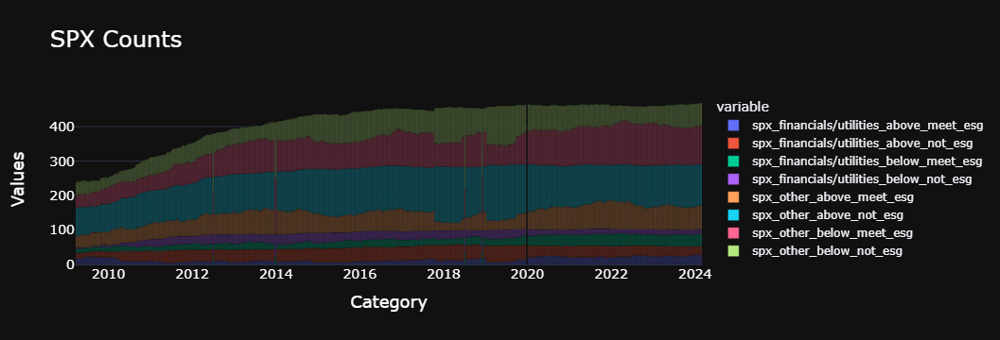

In [70]:
import plotly.express as px

fig = px.bar(counts[['spx_financials/utilities_above_meet_esg', 'spx_financials/utilities_above_not_esg', 'spx_financials/utilities_below_meet_esg', 'spx_financials/utilities_below_not_esg', 'spx_other_above_meet_esg', 'spx_other_above_not_esg', 'spx_other_below_meet_esg', 'spx_other_below_not_esg']], title='SPX Counts')

fig.update_layout(
    template='plotly_dark',
    title_font=dict(size=24, color='white'),
    xaxis=dict(
        title='Category',
        titlefont=dict(size=18, color='white'),
        tickfont=dict(size=14, color='white')
    ),
    yaxis=dict(
        title='Values',
        titlefont=dict(size=18, color='white'),
        tickfont=dict(size=14, color='white')
    )
)
fig.show()
fig.write_html("spx_counts.html")

C:\Users\anish\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



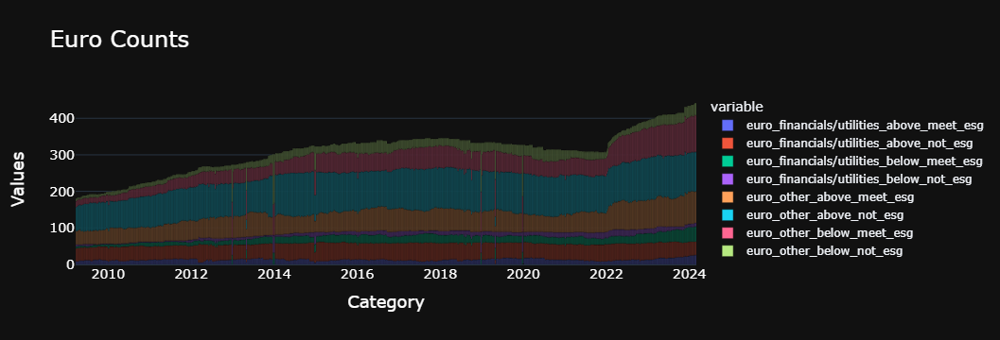

In [75]:
fig = px.bar(counts[['euro_financials/utilities_above_meet_esg', 'euro_financials/utilities_above_not_esg', 'euro_financials/utilities_below_meet_esg', 'euro_financials/utilities_below_not_esg', 'euro_other_above_meet_esg', 'euro_other_above_not_esg', 'euro_other_below_meet_esg', 'euro_other_below_not_esg']], title='Euro Counts')

fig.update_layout(
    template='plotly_dark',
    title_font=dict(size=24, color='white'),
    xaxis=dict(
        title='Category',
        titlefont=dict(size=18, color='white'),
        tickfont=dict(size=14, color='white')
    ),
    yaxis=dict(
        title='Values',
        titlefont=dict(size=18, color='white'),
        tickfont=dict(size=14, color='white')
    )
)
fig.show()
fig.write_html("euro_counts.html")